In [9]:
# biblioteka
!pip install liac-arff

 # Importy i wczytanie danych

In [10]:
import arff
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## Wczytanie pliku ARFF za pomocą liac-arff

In [11]:
with open('quality-prediction-in-a-mining-process.arff', 'r') as f:
    dataset = arff.load(f)

## Tworzenie DataFrame z danych

In [12]:
df = pd.DataFrame(dataset['data'], columns=[attr[0] for attr in dataset['attributes']])

# Zapisz do CSV
Spark nie wspiera natywnie .arff więc musimy przekonwertować plik z danymi do csv

In [13]:
df.to_csv("quality-prediction.csv", index=False)

# Uruchomienie przekonwertowanego zbioru w sparku

In [16]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("Analiza Danych z PySpark") \
    .getOrCreate()

df_spark = spark.read.csv("quality-prediction.csv", header=True, inferSchema=True)
df_spark.show(n=5, truncate=False, vertical=True)

-RECORD 0-------------------------------------------
 date                         | 2017-03-10 01:00:00 
 %_Iron_Feed                  | 55,2                
 %_Silica_Feed                | 16,98               
 Starch_Flow                  | 3019,53             
 Amina_Flow                   | 557,434             
 Ore_Pulp_Flow                | 395,713             
 Ore_Pulp_pH                  | 10,0664             
 Ore_Pulp_Density             | 1,74                
 Flotation_Column_01_Air_Flow | 249,214             
 Flotation_Column_02_Air_Flow | 253,235             
 Flotation_Column_03_Air_Flow | 250,576             
 Flotation_Column_04_Air_Flow | 295,096             
 Flotation_Column_05_Air_Flow | 306,4               
 Flotation_Column_06_Air_Flow | 250,225             
 Flotation_Column_07_Air_Flow | 250,884             
 Flotation_Column_01_Level    | 457,396             
 Flotation_Column_02_Level    | 432,962             
 Flotation_Column_03_Level    | 424,954       

# Naprawa danych liczbowych (przecinek → kropka)

In [18]:
from pyspark.sql.functions import regexp_replace, col

for column in df_spark.columns:
    if column != 'date':
        df_spark = df_spark.withColumn(column, regexp_replace(col(column), ",", ".").cast("double"))

# Obliczenie korelacji z %_Silica_Concentrate

In [19]:
target = "%_Silica_Concentrate"
features = [col for col in df_spark.columns if col != target and col != "date"]

for feature in features:
    corr = df_spark.stat.corr(feature, target)
    print(f"Korelacja {feature} → {target}: {corr:.3f}")

Korelacja %_Iron_Feed → %_Silica_Concentrate: -0.077
Korelacja %_Silica_Feed → %_Silica_Concentrate: 0.073
Korelacja Starch_Flow → %_Silica_Concentrate: -0.066
Korelacja Amina_Flow → %_Silica_Concentrate: 0.157
Korelacja Ore_Pulp_Flow → %_Silica_Concentrate: 0.008
Korelacja Ore_Pulp_pH → %_Silica_Concentrate: -0.148
Korelacja Ore_Pulp_Density → %_Silica_Concentrate: 0.047
Korelacja Flotation_Column_01_Air_Flow → %_Silica_Concentrate: -0.219
Korelacja Flotation_Column_02_Air_Flow → %_Silica_Concentrate: -0.167
Korelacja Flotation_Column_03_Air_Flow → %_Silica_Concentrate: -0.219
Korelacja Flotation_Column_04_Air_Flow → %_Silica_Concentrate: -0.005
Korelacja Flotation_Column_05_Air_Flow → %_Silica_Concentrate: -0.009
Korelacja Flotation_Column_06_Air_Flow → %_Silica_Concentrate: -0.050
Korelacja Flotation_Column_07_Air_Flow → %_Silica_Concentrate: -0.072
Korelacja Flotation_Column_01_Level → %_Silica_Concentrate: 0.017
Korelacja Flotation_Column_02_Level → %_Silica_Concentrate: 0.031
Kor

Przygotowanie danych do modelu regresyjnego (np. dla wykresu wpływu cechy)

In [20]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.regression import LinearRegression

for feature in features:
    assembler = VectorAssembler(inputCols=[feature], outputCol="features")
    assembled = assembler.transform(df_spark.select(feature, target).na.drop())

    lr = LinearRegression(featuresCol="features", labelCol=target)
    model = lr.fit(assembled)

    coef = model.coefficients[0]
    intercept = model.intercept
    r2 = model.summary.r2
    print(f"{feature}: Współczynnik = {coef:.4f}, Przecięcie = {intercept:.4f}, R² = {r2:.4f}")


%_Iron_Feed: Współczynnik = -0.0168, Przecięcie = 3.2733, R² = 0.0059
%_Silica_Feed: Współczynnik = 0.0120, Przecięcie = 2.1506, R² = 0.0053
Starch_Flow: Współczynnik = -0.0001, Przecięcie = 2.5032, R² = 0.0044
Amina_Flow: Współczynnik = 0.0019, Przecięcie = 1.3830, R² = 0.0246
Ore_Pulp_Flow: Współczynnik = 0.0010, Przecięcie = 1.9474, R² = 0.0001
Ore_Pulp_pH: Współczynnik = -0.4297, Przecięcie = 6.5237, R² = 0.0218
Ore_Pulp_Density: Współczynnik = 0.7637, Przecięcie = 1.0435, R² = 0.0022
Flotation_Column_01_Air_Flow: Współczynnik = -0.0083, Przecięcie = 4.6598, R² = 0.0480
Flotation_Column_02_Air_Flow: Współczynnik = -0.0062, Przecięcie = 4.0588, R² = 0.0280
Flotation_Column_03_Air_Flow: Współczynnik = -0.0086, Przecięcie = 4.7517, R² = 0.0479
Flotation_Column_04_Air_Flow: Współczynnik = -0.0022, Przecięcie = 2.9833, R² = 0.0000
Flotation_Column_05_Air_Flow: Współczynnik = -0.0029, Przecięcie = 3.1894, R² = 0.0001
Flotation_Column_06_Air_Flow: Współczynnik = -0.0018, Przecięcie = 2.86

Wizualizacja z matplotlib + sample z PySpark

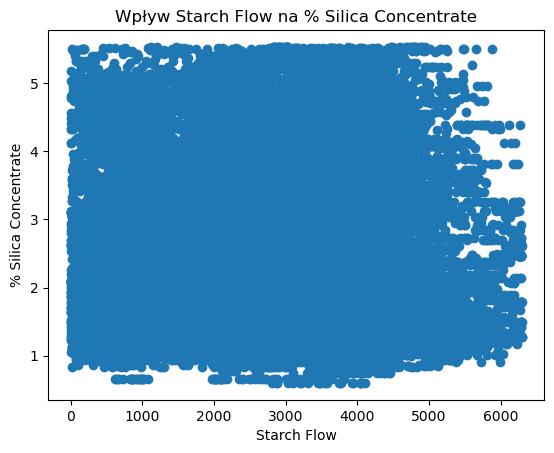

In [22]:
sample_df = df_spark.select("Starch_Flow", target).dropna().sample(fraction=0.1, seed=42)
data = sample_df.toPandas()

import matplotlib.pyplot as plt

plt.scatter(data["Starch_Flow"], data[target])
plt.xlabel("Starch Flow")
plt.ylabel("% Silica Concentrate")
plt.title("Wpływ Starch Flow na % Silica Concentrate")
plt.show()

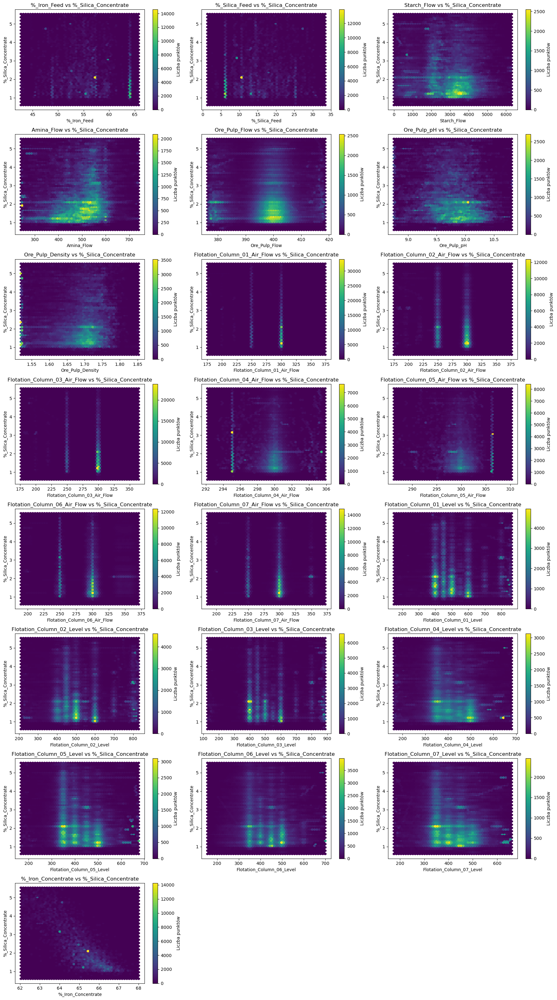

In [24]:
from pyspark.sql.functions import regexp_replace, col
import matplotlib.pyplot as plt
import math

# 2. Cały DataFrame do Pandas (uważaj na wielkość danych!)
pandas_df = df_spark.dropna().toPandas()

# 3. Lista cech
target = "%_Silica_Concentrate"
features = [col for col in pandas_df.columns if col not in ['date', target]]

# 4. Wykresy hexbin dla wszystkich cech
num_cols = len(features)
cols_per_row = 3
rows = math.ceil(num_cols / cols_per_row)

plt.figure(figsize=(cols_per_row * 6, rows * 4))

for i, feature in enumerate(features, 1):
    plt.subplot(rows, cols_per_row, i)
    hb = plt.hexbin(pandas_df[feature], pandas_df[target], gridsize=50, cmap='viridis')
    plt.colorbar(hb, label='Liczba punktów')
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.title(f"{feature} vs {target}")

plt.tight_layout()
plt.show()


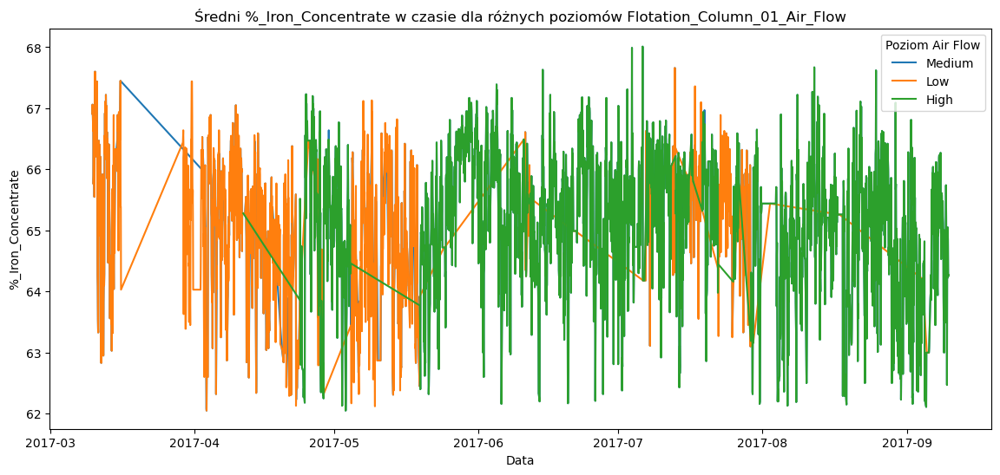

In [25]:
from pyspark.sql.functions import col, to_timestamp, avg, expr

# Zamień datę na timestamp
df_spark = df_spark.withColumn("date", to_timestamp(col("date"), "yyyy-MM-dd HH:mm:ss"))

# Podziel na grupy kwantylowe na bazie Flotation_Column_01_Air_Flow (np. na 3 grupy)
quantiles = df_spark.approxQuantile("Flotation_Column_01_Air_Flow", [0.33, 0.66], 0.01)

df_spark = df_spark.withColumn("AirFlow_group", 
    expr(f"""
    CASE
      WHEN Flotation_Column_01_Air_Flow <= {quantiles[0]} THEN 'Low'
      WHEN Flotation_Column_01_Air_Flow <= {quantiles[1]} THEN 'Medium'
      ELSE 'High'
    END
    """)
)

# Oblicz średni %_Iron_Concentrate dla każdej grupy i daty (możesz grupować po godzinach, dniach itd.)
df_avg = df_spark.groupBy("date", "AirFlow_group").agg(avg("%_Iron_Concentrate").alias("avg_Iron"))

# Konwersja do Pandas do wizualizacji
pdf_avg = df_avg.orderBy("date").toPandas()

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14,6))
sns.lineplot(data=pdf_avg, x="date", y="avg_Iron", hue="AirFlow_group")
plt.title("Średni %_Iron_Concentrate w czasie dla różnych poziomów Flotation_Column_01_Air_Flow")
plt.xlabel("Data")
plt.ylabel("%_Iron_Concentrate")
plt.legend(title="Poziom Air Flow")
plt.show()

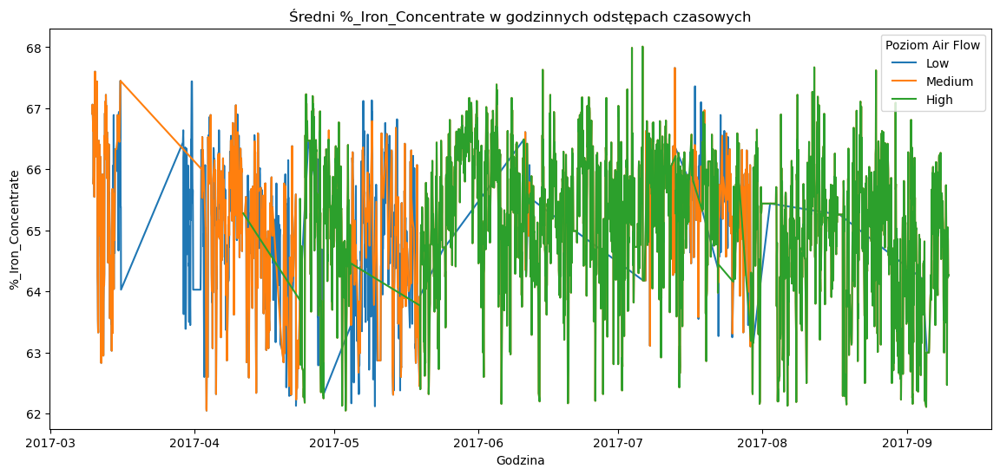

In [26]:
from pyspark.sql.functions import window, avg

# Grupowanie po godzinach i AirFlow_group, liczenie średniego %_Iron_Concentrate
df_hourly = df_spark.groupBy(
    window(col("date"), "1 hour"),
    col("AirFlow_group")
).agg(avg("%_Iron_Concentrate").alias("avg_Iron"))

# Rozpakowanie okna (window) do kolumny start (godzina)
df_hourly = df_hourly.select(
    col("window.start").alias("hour"),
    col("AirFlow_group"),
    col("avg_Iron")
).orderBy("hour")

pdf_hourly = df_hourly.toPandas()

# Wykres
plt.figure(figsize=(14,6))
sns.lineplot(data=pdf_hourly, x="hour", y="avg_Iron", hue="AirFlow_group")
plt.title("Średni %_Iron_Concentrate w godzinnych odstępach czasowych")
plt.xlabel("Godzina")
plt.ylabel("%_Iron_Concentrate")
plt.legend(title="Poziom Air Flow")
plt.show()


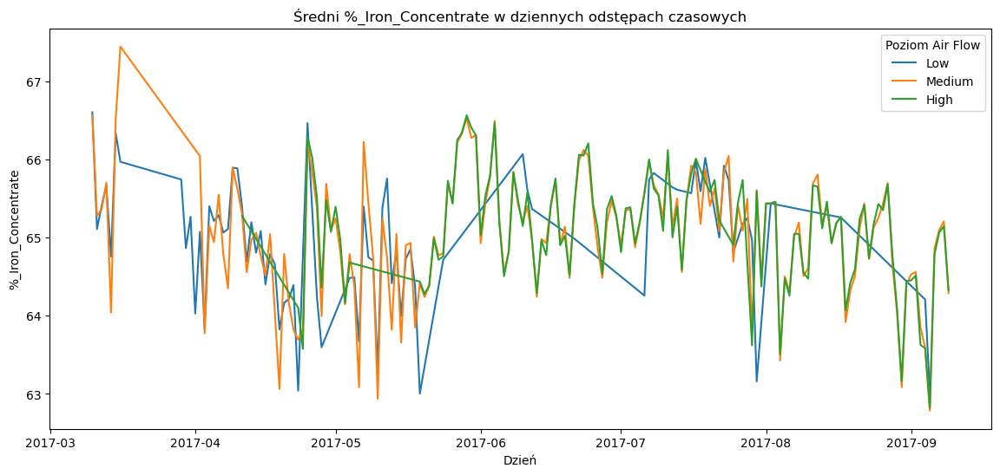

In [27]:
df_daily = df_spark.groupBy(
    window(col("date"), "1 day"),
    col("AirFlow_group")
).agg(avg("%_Iron_Concentrate").alias("avg_Iron"))

df_daily = df_daily.select(
    col("window.start").alias("day"),
    col("AirFlow_group"),
    col("avg_Iron")
).orderBy("day")

pdf_daily = df_daily.toPandas()

plt.figure(figsize=(14,6))
sns.lineplot(data=pdf_daily, x='day', y='avg_Iron', hue='AirFlow_group')
plt.title("Średni %_Iron_Concentrate w dziennych odstępach czasowych")
plt.xlabel("Dzień")
plt.ylabel("%_Iron_Concentrate")
plt.legend(title="Poziom Air Flow")
plt.show()


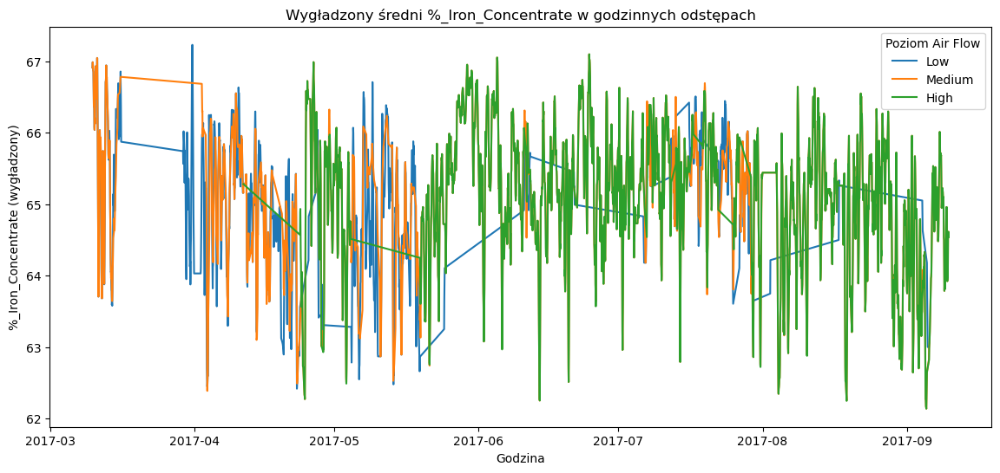

In [28]:
pdf_hourly['avg_Iron_smooth'] = pdf_hourly.groupby('AirFlow_group')['avg_Iron'].transform(lambda x: x.rolling(window=5, min_periods=1).mean())

plt.figure(figsize=(14,6))
sns.lineplot(data=pdf_hourly, x='hour', y='avg_Iron_smooth', hue='AirFlow_group')
plt.title('Wygładzony średni %_Iron_Concentrate w godzinnych odstępach')
plt.xlabel('Godzina')
plt.ylabel('%_Iron_Concentrate (wygładzony)')
plt.legend(title='Poziom Air Flow')
plt.show()


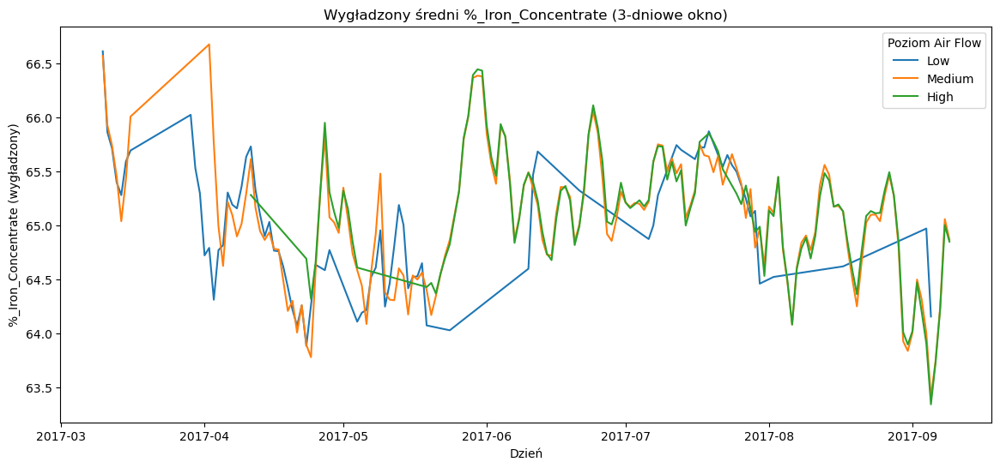

In [29]:
pdf_daily['avg_Iron_smooth'] = pdf_daily.groupby('AirFlow_group')['avg_Iron'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())

plt.figure(figsize=(14,6))
sns.lineplot(data=pdf_daily, x='day', y='avg_Iron_smooth', hue='AirFlow_group')
plt.title("Wygładzony średni %_Iron_Concentrate (3-dniowe okno)")
plt.xlabel("Dzień")
plt.ylabel("%_Iron_Concentrate (wygładzony)")
plt.legend(title="Poziom Air Flow")
plt.show()


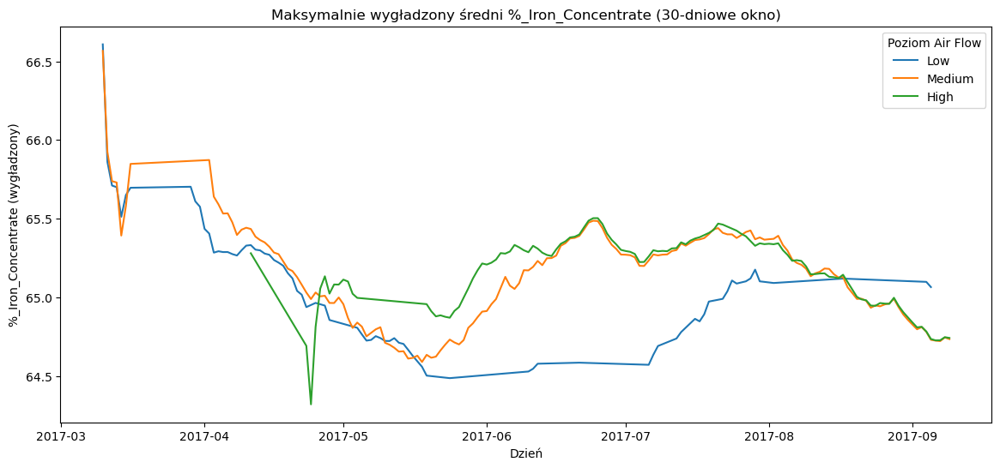

In [30]:
pdf_daily['avg_Iron_smooth'] = pdf_daily.groupby('AirFlow_group')['avg_Iron'].transform(
    lambda x: x.rolling(window=30, min_periods=1).mean()
)

plt.figure(figsize=(14,6))
sns.lineplot(data=pdf_daily, x='day', y='avg_Iron_smooth', hue='AirFlow_group')
plt.title("Maksymalnie wygładzony średni %_Iron_Concentrate (30-dniowe okno)")
plt.xlabel("Dzień")
plt.ylabel("%_Iron_Concentrate (wygładzony)")
plt.legend(title="Poziom Air Flow")
plt.show()


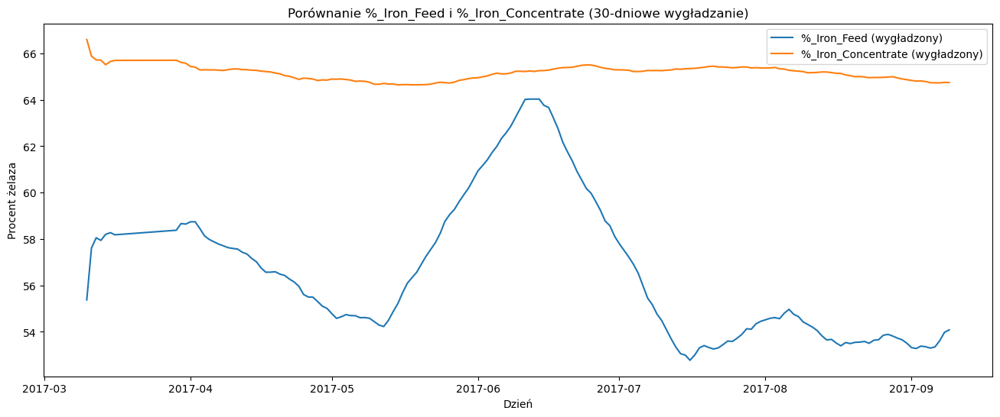

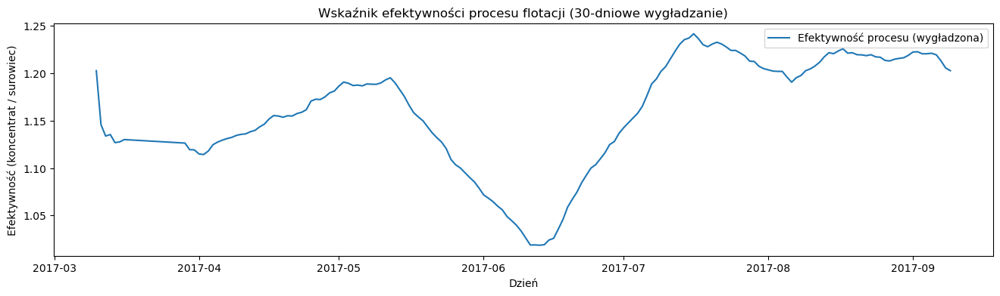

In [31]:
from pyspark.sql.functions import to_date, col
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Dodaj kolumnę z datą (bez czasu)
df_daily = df_spark.withColumn("day", to_date(col("date")))

# 2. Agregacja średnich dziennych dla Iron_Feed i Iron_Concentrate
df_daily_agg = df_daily.groupBy("day").agg(
    {'%_Iron_Feed': 'avg', '%_Iron_Concentrate': 'avg'}
).withColumnRenamed("avg(%_Iron_Feed)", "avg_Iron_Feed") \
 .withColumnRenamed("avg(%_Iron_Concentrate)", "avg_Iron_Concentrate")

# 3. Konwersja do pandas do wygładzania i wykresów
pdf_daily = df_daily_agg.toPandas()
pdf_daily = pdf_daily.sort_values('day')

# 4. Dodajemy wskaźnik efektywności
pdf_daily['efficiency'] = pdf_daily['avg_Iron_Concentrate'] / pdf_daily['avg_Iron_Feed']

# 5. Wygładzanie - 30 dni okno rolling mean
pdf_daily['Iron_Feed_smooth'] = pdf_daily['avg_Iron_Feed'].rolling(window=30, min_periods=1).mean()
pdf_daily['Iron_Concentrate_smooth'] = pdf_daily['avg_Iron_Concentrate'].rolling(window=30, min_periods=1).mean()
pdf_daily['efficiency_smooth'] = pdf_daily['efficiency'].rolling(window=30, min_periods=1).mean()

# 6. Wykresy
plt.figure(figsize=(16, 6))
plt.plot(pdf_daily['day'], pdf_daily['Iron_Feed_smooth'], label='%_Iron_Feed (wygładzony)')
plt.plot(pdf_daily['day'], pdf_daily['Iron_Concentrate_smooth'], label='%_Iron_Concentrate (wygładzony)')
plt.title("Porównanie %_Iron_Feed i %_Iron_Concentrate (30-dniowe wygładzanie)")
plt.xlabel("Dzień")
plt.ylabel("Procent żelaza")
plt.legend()
plt.show()

plt.figure(figsize=(16, 4))
plt.plot(pdf_daily['day'], pdf_daily['efficiency_smooth'], label='Efektywność procesu (wygładzona)')
plt.title("Wskaźnik efektywności procesu flotacji (30-dniowe wygładzanie)")
plt.xlabel("Dzień")
plt.ylabel("Efektywność (koncentrat / surowiec)")
plt.legend()
plt.show()


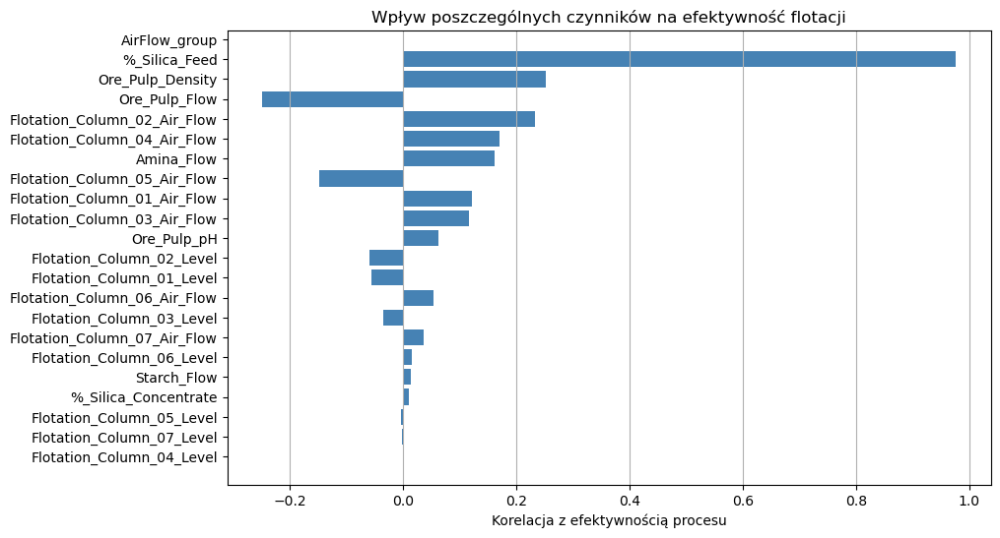

In [32]:
from pyspark.sql.functions import to_date, col
import matplotlib.pyplot as plt
import pandas as pd
import math

# 1. Przygotowanie df: dzienna agregacja i wskaźnik efektywności
df_daily = df_spark.withColumn("day", to_date(col("date")))

agg_expr = {c: "avg" for c in df_spark.columns if c not in ['date']}
df_daily_agg = df_daily.groupBy("day").agg(agg_expr)

# Renaming kolumn avg(...)
for c in agg_expr.keys():
    df_daily_agg = df_daily_agg.withColumnRenamed(f"avg({c})", c)

# Obliczamy efektywność
df_daily_agg = df_daily_agg.withColumn(
    "efficiency", col("%_Iron_Concentrate") / col("%_Iron_Feed")
)

# Konwersja do Pandas
pdf = df_daily_agg.toPandas().sort_values("day")

# 2. Lista cech do korelacji (bez daty i wartości docelowych)
features = [c for c in pdf.columns if c not in ["day", "%_Iron_Concentrate", "%_Iron_Feed", "efficiency"]]

# 3. Oblicz korelacje cech z efektywnością
correlations = {}
for feature in features:
    corr = pdf[feature].corr(pdf["efficiency"])
    correlations[feature] = corr

# 4. Sortujemy według wartości korelacji (absolutnej)
sorted_corr = dict(sorted(correlations.items(), key=lambda item: abs(item[1]), reverse=True))

# 5. Wykres korelacji
plt.figure(figsize=(10,6))
plt.barh(list(sorted_corr.keys()), list(sorted_corr.values()), color="steelblue")
plt.xlabel("Korelacja z efektywnością procesu")
plt.title("Wpływ poszczególnych czynników na efektywność flotacji")
plt.grid(axis='x')
plt.gca().invert_yaxis()
plt.show()


sdfgdfsgsfgfgsddfgs

In [34]:
from pyspark.sql.functions import regexp_replace, col

# Lista kolumn, które mają wartości liczbowe w formacie string z przecinkiem
num_cols = [c for c in df_spark.columns if c != "date"]

# Zamiana przecinków na kropki i konwersja na float
for c in num_cols:
    df_spark = df_spark.withColumn(c,
                                   regexp_replace(col(c), ",", ".").cast("float"))

# Teraz możesz spróbować policzyć korelację
target = "%_Iron_Concentrate"
features = [c for c in df_spark.columns if c not in ["date", target]]

for feature in features:
    corr = df_spark.stat.corr(feature, target)
    print(f"Korelacja {feature} -> {target}: {corr:.3f}")


Korelacja %_Iron_Feed -> %_Iron_Concentrate: 0.055
Korelacja %_Silica_Feed -> %_Iron_Concentrate: -0.044
Korelacja Starch_Flow -> %_Iron_Concentrate: 0.070
Korelacja Amina_Flow -> %_Iron_Concentrate: -0.110
Korelacja Ore_Pulp_Flow -> %_Iron_Concentrate: 0.083
Korelacja Ore_Pulp_pH -> %_Iron_Concentrate: 0.193
Korelacja Ore_Pulp_Density -> %_Iron_Concentrate: 0.016
Korelacja Flotation_Column_01_Air_Flow -> %_Iron_Concentrate: 0.099
Korelacja Flotation_Column_02_Air_Flow -> %_Iron_Concentrate: 0.059
Korelacja Flotation_Column_03_Air_Flow -> %_Iron_Concentrate: 0.100
Korelacja Flotation_Column_04_Air_Flow -> %_Iron_Concentrate: -0.067
Korelacja Flotation_Column_05_Air_Flow -> %_Iron_Concentrate: 0.089
Korelacja Flotation_Column_06_Air_Flow -> %_Iron_Concentrate: -0.037
Korelacja Flotation_Column_07_Air_Flow -> %_Iron_Concentrate: -0.002
Korelacja Flotation_Column_01_Level -> %_Iron_Concentrate: -0.014
Korelacja Flotation_Column_02_Level -> %_Iron_Concentrate: -0.026
Korelacja Flotation_Co

In [35]:
corr_threshold = 0.1
important_features = []

for feature in features:
    corr = df_spark.stat.corr(feature, target)
    if corr is not None and abs(corr) > corr_threshold:
        important_features.append(feature)
print("Najważniejsze cechy:", important_features)


Najważniejsze cechy: ['Amina_Flow', 'Ore_Pulp_pH', 'Flotation_Column_03_Air_Flow', 'Flotation_Column_04_Level', 'Flotation_Column_05_Level', 'Flotation_Column_07_Level', '%_Silica_Concentrate']


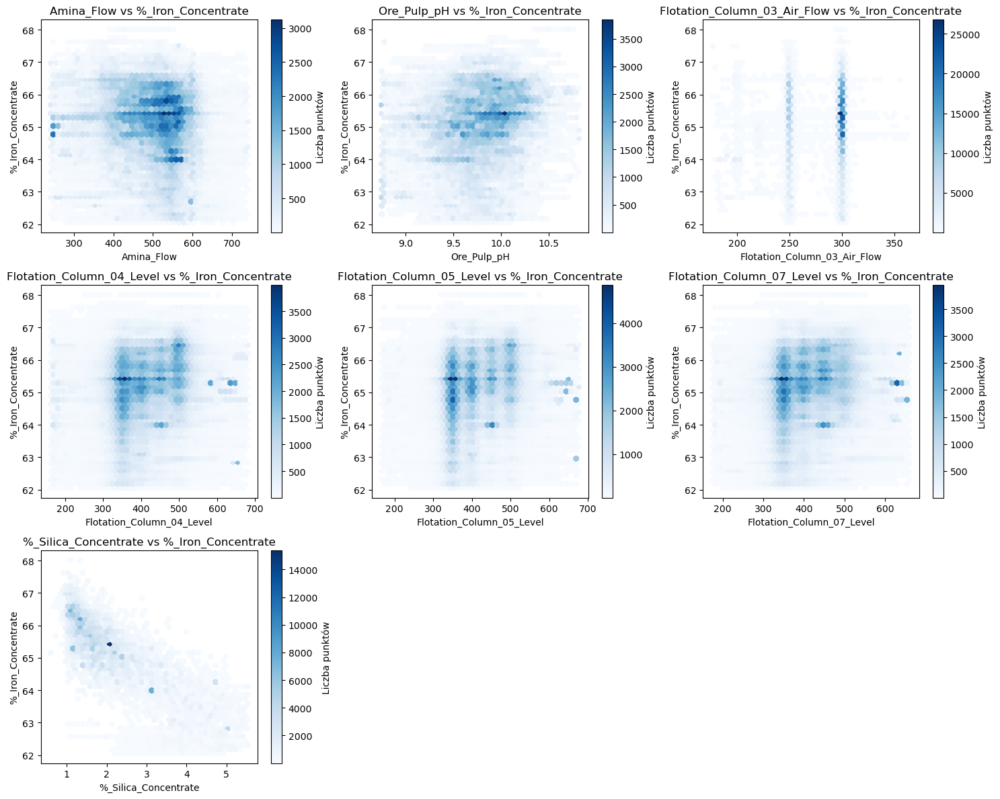

In [36]:
import matplotlib.pyplot as plt
import math

# Pobieramy dane (drop na null i tylko wybrane cechy + target)
pandas_df = df_spark.select(important_features + [target]).dropna().toPandas()

num_cols = len(important_features)
cols_per_row = 3
rows = math.ceil(num_cols / cols_per_row)

plt.figure(figsize=(cols_per_row * 5, rows * 4))

for i, feature in enumerate(important_features, 1):
    plt.subplot(rows, cols_per_row, i)
    plt.hexbin(pandas_df[feature], pandas_df[target], gridsize=40, cmap='Blues', mincnt=1)
    plt.colorbar(label='Liczba punktów')
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.title(f"{feature} vs {target}")

plt.tight_layout()
plt.show()


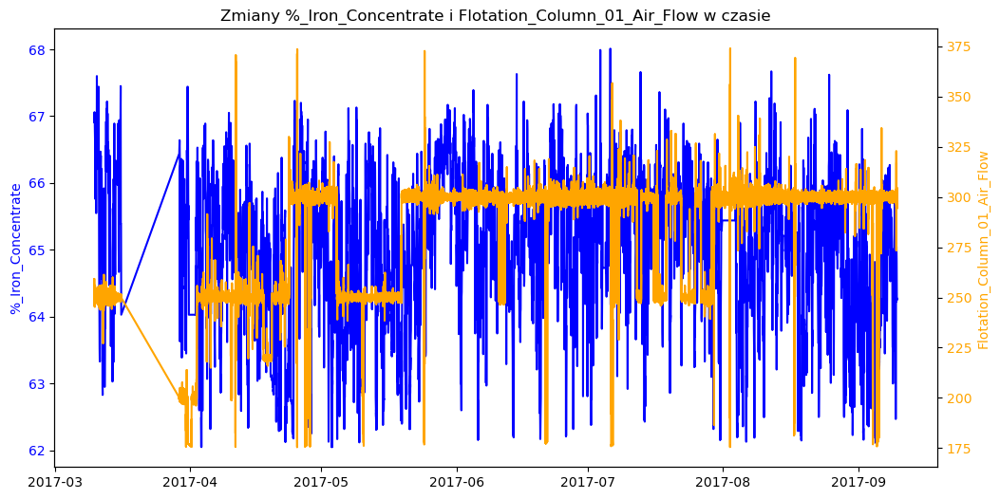

In [37]:
import pandas as pd

# Przekształć datę do formatu datetime
df_spark = df_spark.withColumn("date", col("date").cast("timestamp"))

# Pobierz dane do Pandas
time_df = df_spark.select("date", target, "Flotation_Column_01_Air_Flow").dropna().toPandas()

# Posortuj po dacie
time_df = time_df.sort_values("date")

# Wykres liniowy na dwóch osiach Y
fig, ax1 = plt.subplots(figsize=(12,6))

ax1.plot(time_df["date"], time_df[target], color="blue", label=target)
ax1.set_ylabel(target, color="blue")
ax1.tick_params(axis='y', labelcolor="blue")

ax2 = ax1.twinx()
ax2.plot(time_df["date"], time_df["Flotation_Column_01_Air_Flow"], color="orange", label="Air Flow")
ax2.set_ylabel("Flotation_Column_01_Air_Flow", color="orange")
ax2.tick_params(axis='y', labelcolor="orange")

plt.title(f"Zmiany {target} i Flotation_Column_01_Air_Flow w czasie")
plt.show()


In [42]:
from pyspark.sql.functions import regexp_replace, col

# Zamiana przecinków na kropki i konwersja do float dla wszystkich kolumn, które nas interesują
air_columns = [c for c in df_spark.columns if "Air_Flow" in c]
all_columns = air_columns + ["%_Iron_Concentrate"]

df_clean = df_spark

for c in all_columns:
    df_clean = df_clean.withColumn(c, regexp_replace(col(c), ",", ".").cast("float"))

# Usuwamy wiersze z brakującymi wartościami w tych kolumnach
df_clean = df_clean.dropna(subset=all_columns)

# Konwersja do Pandas
pandas_df = df_clean.toPandas()


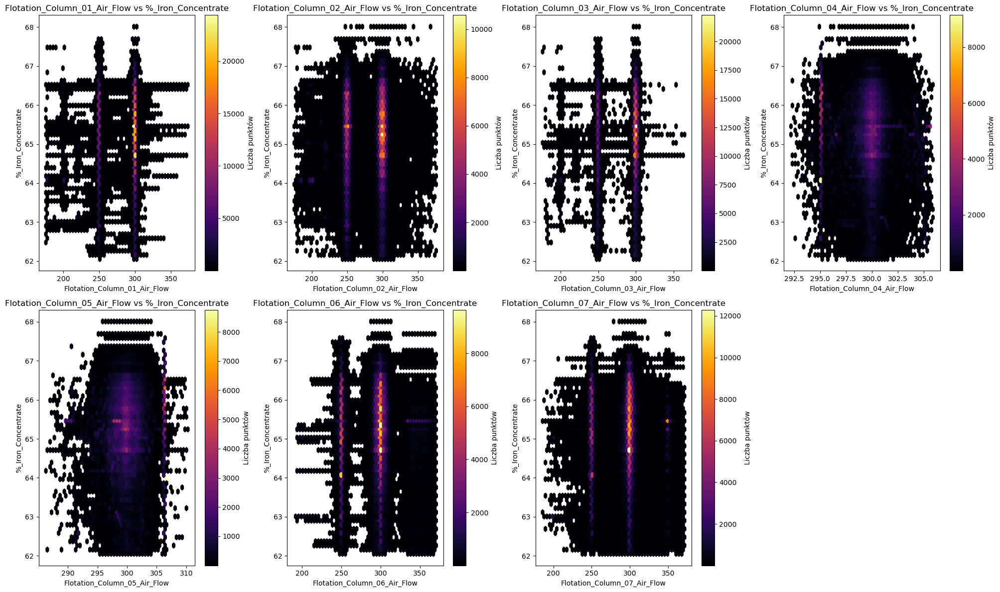

In [43]:
import matplotlib.pyplot as plt

target = "%_Iron_Concentrate"

plt.figure(figsize=(20, 12))

for i, col_air in enumerate(air_columns, 1):
    plt.subplot(2, 4, i)  # Dostosuj liczbę wierszy i kolumn wg liczby kolumn Air_Flow
    plt.hexbin(pandas_df[col_air], pandas_df[target], gridsize=50, cmap='inferno', mincnt=1)
    plt.colorbar(label='Liczba punktów')
    plt.xlabel(col_air)
    plt.ylabel(target)
    plt.title(f"{col_air} vs {target}")

plt.tight_layout()
plt.show()


In [44]:
from pyspark.sql.functions import regexp_replace, col
import pandas as pd

# Kolumny z nawiewem powietrza
air_columns = [c for c in df_spark.columns if "Air_Flow" in c]

# Zamiana przecinków na kropki i konwersja na float
cols_to_cast = air_columns + ["%_Iron_Concentrate"]

df_clean = df_spark
for c in cols_to_cast:
    df_clean = df_clean.withColumn(c, regexp_replace(col(c), ",", ".").cast("float"))

# Konwersja kolumny 'date' do timestamp
df_clean = df_clean.withColumn("date", col("date").cast("timestamp"))

# Usuń wiersze z brakującymi wartościami
df_clean = df_clean.dropna(subset=cols_to_cast + ["date"])

# Konwersja do Pandas
pandas_df = df_clean.select(["date"] + cols_to_cast).toPandas()

# Posortuj po dacie
pandas_df = pandas_df.sort_values(by="date")


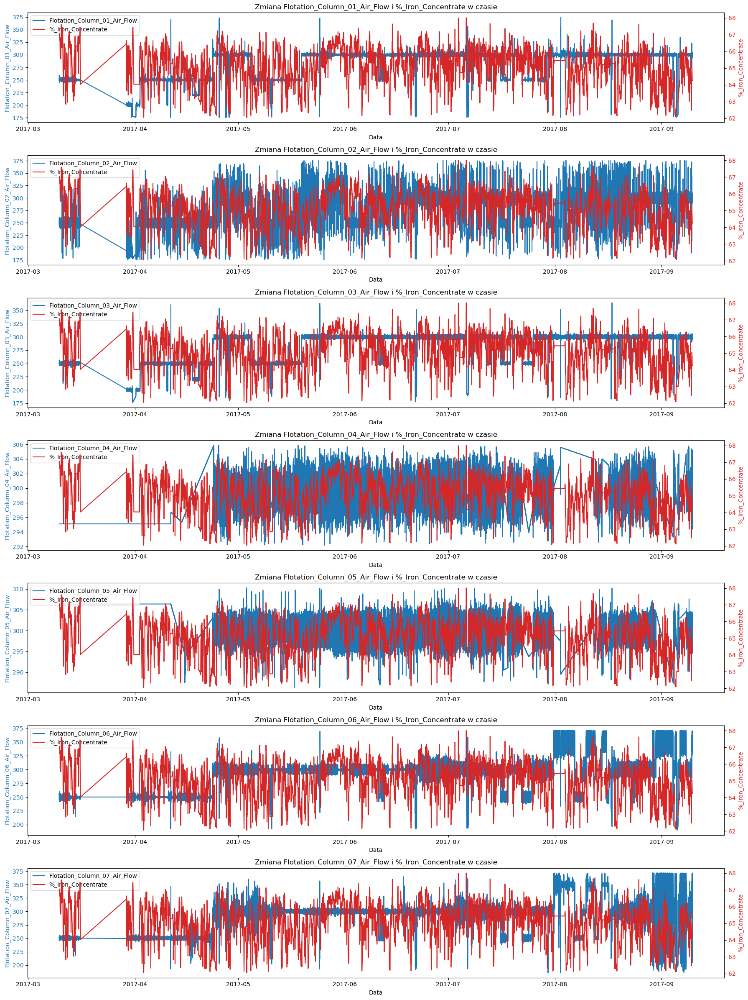

In [45]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 24))
num_plots = len(air_columns)

for i, col_air in enumerate(air_columns, 1):
    plt.subplot(num_plots, 1, i)
    
    ax1 = plt.gca()
    ax1.plot(pandas_df["date"], pandas_df[col_air], color="tab:blue", label=col_air)
    ax1.set_ylabel(f"{col_air}", color="tab:blue")
    ax1.tick_params(axis='y', labelcolor="tab:blue")
    
    ax2 = ax1.twinx()
    ax2.plot(pandas_df["date"], pandas_df["%_Iron_Concentrate"], color="tab:red", label="%_Iron_Concentrate")
    ax2.set_ylabel("%_Iron_Concentrate", color="tab:red")
    ax2.tick_params(axis='y', labelcolor="tab:red")
    
    plt.title(f"Zmiana {col_air} i %_Iron_Concentrate w czasie")
    ax1.set_xlabel("Data")
    
    # Opcjonalnie legendy
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.tight_layout()
plt.show()


In [46]:
window_size = 50  # liczba próbek do wygładzania, możesz dostosować

# Tworzymy kolumny wygładzone:
for col_air in air_columns + ["%_Iron_Concentrate"]:
    pandas_df[col_air + "_smoothed"] = pandas_df[col_air].rolling(window=window_size, min_periods=1).mean()


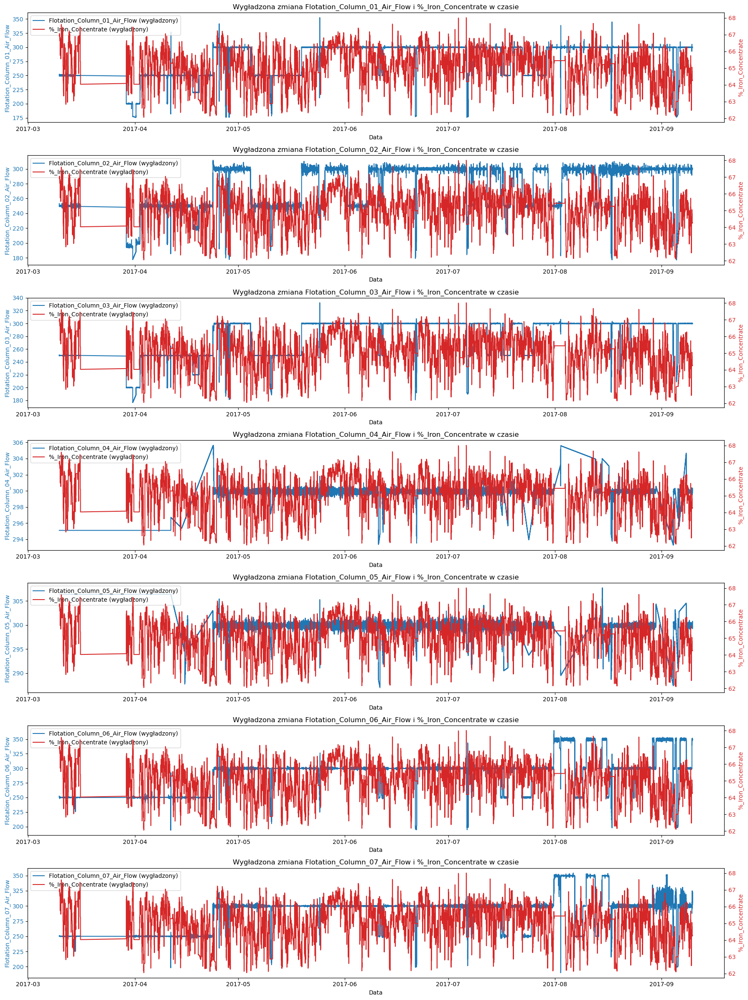

In [47]:
plt.figure(figsize=(18, 24))
num_plots = len(air_columns)

for i, col_air in enumerate(air_columns, 1):
    plt.subplot(num_plots, 1, i)
    
    ax1 = plt.gca()
    ax1.plot(pandas_df["date"], pandas_df[col_air + "_smoothed"], color="tab:blue", label=col_air + " (wygładzony)")
    ax1.set_ylabel(f"{col_air}", color="tab:blue")
    ax1.tick_params(axis='y', labelcolor="tab:blue")
    
    ax2 = ax1.twinx()
    ax2.plot(pandas_df["date"], pandas_df["%_Iron_Concentrate_smoothed"], color="tab:red", label="%_Iron_Concentrate (wygładzony)")
    ax2.set_ylabel("%_Iron_Concentrate", color="tab:red")
    ax2.tick_params(axis='y', labelcolor="tab:red")
    
    plt.title(f"Wygładzona zmiana {col_air} i %_Iron_Concentrate w czasie")
    ax1.set_xlabel("Data")
    
    # Legendy
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.tight_layout()
plt.show()


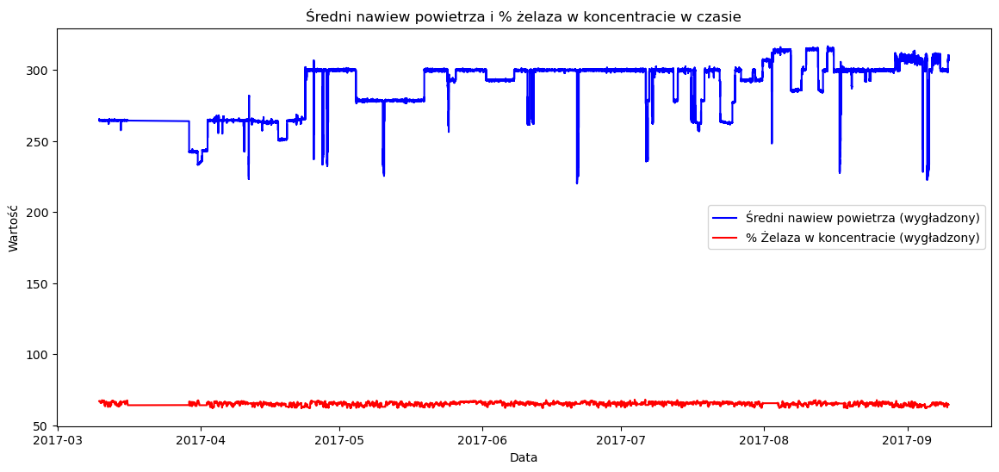

In [48]:
# Lista kolumn z nawiewem powietrza
air_columns = [
    "Flotation_Column_01_Air_Flow",
    "Flotation_Column_02_Air_Flow",
    "Flotation_Column_03_Air_Flow",
    "Flotation_Column_04_Air_Flow",
    "Flotation_Column_05_Air_Flow",
    "Flotation_Column_06_Air_Flow",
    "Flotation_Column_07_Air_Flow"
]

# Tworzymy nową kolumnę ze średnią z tych 7 kolumn
pandas_df['Air_Flow_Mean'] = pandas_df[air_columns].mean(axis=1)

# Opcjonalnie — wygładzamy średnią i koncentrat żelaza (np. średnia krocząca)
window_size = 50
pandas_df['Air_Flow_Mean_smoothed'] = pandas_df['Air_Flow_Mean'].rolling(window=window_size, min_periods=1).mean()
pandas_df['%_Iron_Concentrate_smoothed'] = pandas_df['%_Iron_Concentrate'].rolling(window=window_size, min_periods=1).mean()

# Wykres
plt.figure(figsize=(14,6))
plt.plot(pandas_df['date'], pandas_df['Air_Flow_Mean_smoothed'], label='Średni nawiew powietrza (wygładzony)', color='blue')
plt.plot(pandas_df['date'], pandas_df['%_Iron_Concentrate_smoothed'], label='% Żelaza w koncentracie (wygładzony)', color='red')
plt.xlabel('Data')
plt.ylabel('Wartość')
plt.title('Średni nawiew powietrza i % żelaza w koncentracie w czasie')
plt.legend()
plt.show()


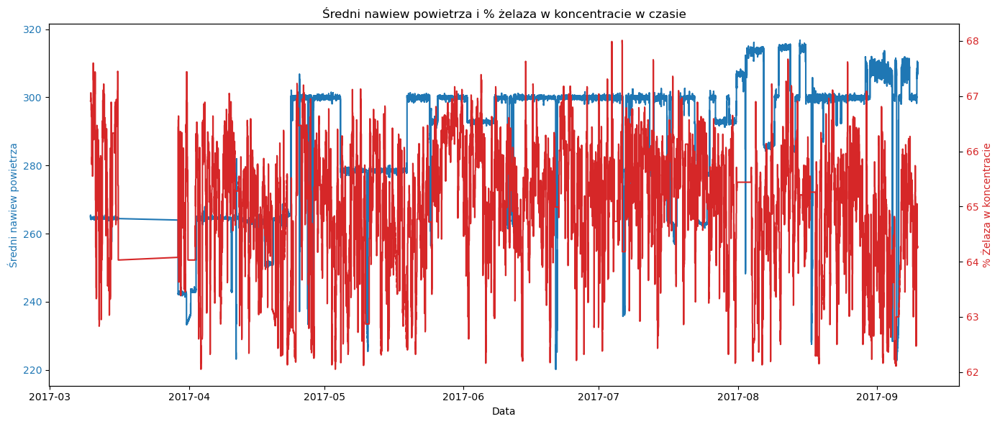

In [50]:
fig, ax1 = plt.subplots(figsize=(14,6))

color1 = 'tab:blue'
ax1.set_xlabel('Data')
ax1.set_ylabel('Średni nawiew powietrza', color=color1)
ax1.plot(pandas_df['date'], pandas_df['Air_Flow_Mean_smoothed'], color=color1)
ax1.tick_params(axis='y', labelcolor=color1)

ax2 = ax1.twinx()  # druga oś Y
color2 = 'tab:red'
ax2.set_ylabel('% Żelaza w koncentracie', color=color2)
ax2.plot(pandas_df['date'], pandas_df['%_Iron_Concentrate_smoothed'], color=color2)
ax2.tick_params(axis='y', labelcolor=color2)

plt.title('Średni nawiew powietrza i % żelaza w koncentracie w czasie')
fig.tight_layout()
plt.show()



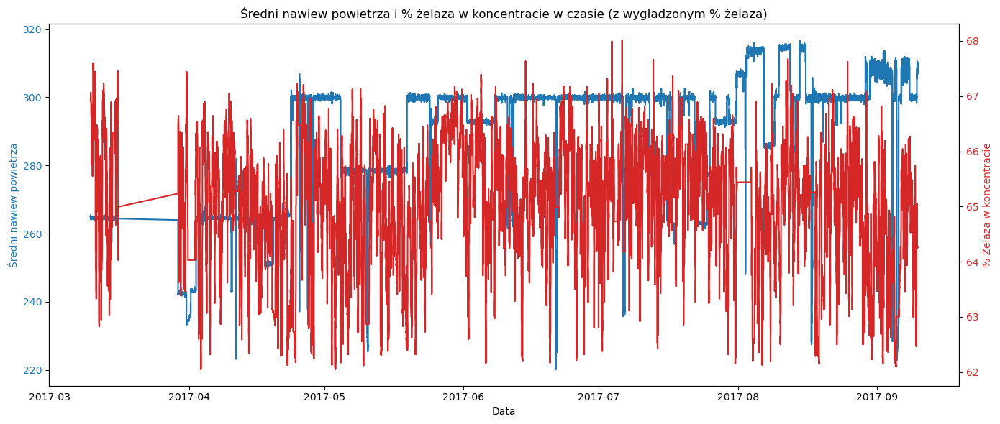

In [51]:
import pandas as pd
import matplotlib.pyplot as plt

# Zakładam, że 'date' jest już datetime
pandas_df['%_Iron_Concentrate_smoothed'] = pandas_df['%_Iron_Concentrate'].rolling(window=10, center=True).mean()

fig, ax1 = plt.subplots(figsize=(14,6))

color1 = 'tab:blue'
ax1.set_xlabel('Data')
ax1.set_ylabel('Średni nawiew powietrza', color=color1)
ax1.plot(pandas_df['date'], pandas_df['Air_Flow_Mean_smoothed'], color=color1)
ax1.tick_params(axis='y', labelcolor=color1)

ax2 = ax1.twinx()  # druga oś Y
color2 = 'tab:red'
ax2.set_ylabel('% Żelaza w koncentracie', color=color2)
ax2.plot(pandas_df['date'], pandas_df['%_Iron_Concentrate_smoothed'], color=color2)
ax2.tick_params(axis='y', labelcolor=color2)

plt.title('Średni nawiew powietrza i % żelaza w koncentracie w czasie (z wygładzonym % żelaza)')
fig.tight_layout()
plt.show()


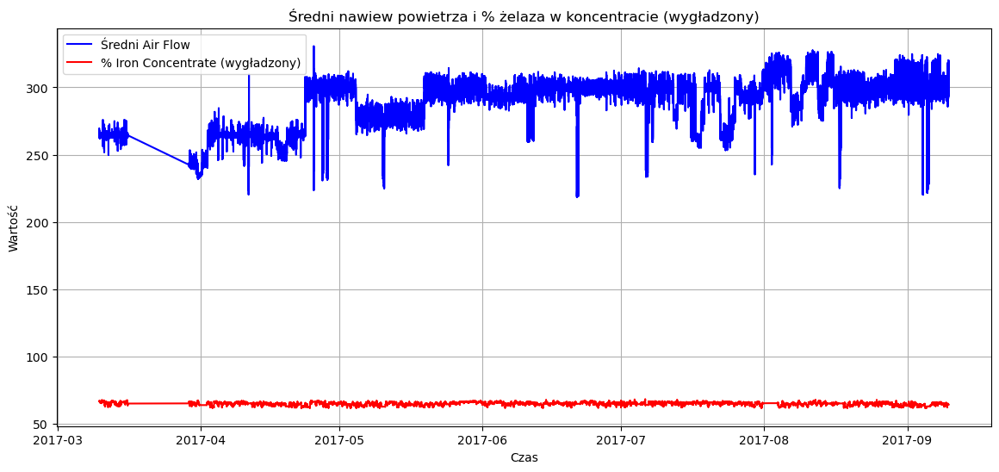

In [53]:
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Załaduj dane do pandas_df wcześniej, z datą jako datetime
pandas_df['date'] = pd.to_datetime(pandas_df['date'])

# Wygładzamy %_Iron_Concentrate filtrem Savitzky-Golay (okno 51, stopień 3)
pandas_df['%_Iron_Concentrate_savgol'] = savgol_filter(pandas_df['%_Iron_Concentrate'], 51, 3)

# Przykładowo uśredniony nawiew powietrza (kolumny Flotation_Column_01_Air_Flow do ..._07_Air_Flow)
airflow_cols = [f'Flotation_Column_0{i}_Air_Flow' for i in range(1,8)]
pandas_df['Airflow_Mean'] = pandas_df[airflow_cols].mean(axis=1)

plt.figure(figsize=(14,6))
plt.plot(pandas_df['date'], pandas_df['Airflow_Mean'], label='Średni Air Flow', color='blue')
plt.plot(pandas_df['date'], pandas_df['%_Iron_Concentrate_savgol'], label='% Iron Concentrate (wygładzony)', color='red')
plt.xlabel('Czas')
plt.ylabel('Wartość')
plt.title('Średni nawiew powietrza i % żelaza w koncentracie (wygładzony)')
plt.legend()
plt.grid(True)
plt.show()



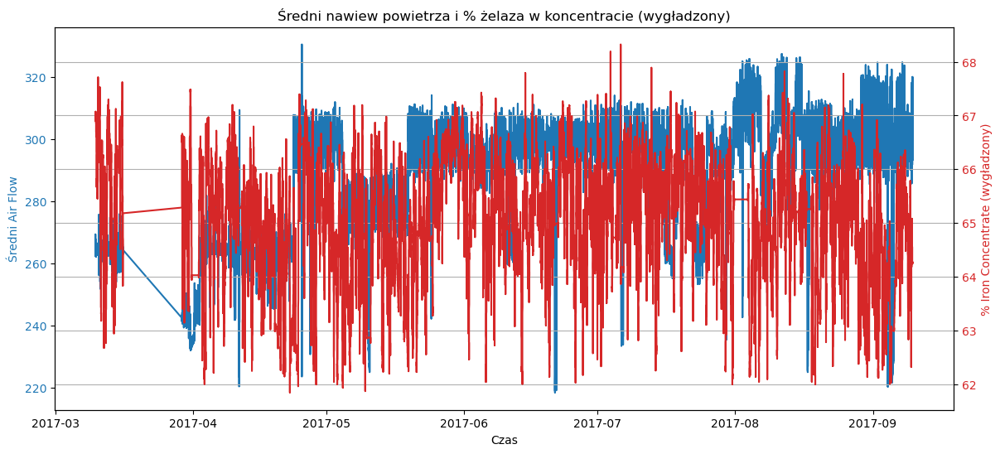

In [54]:
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Zakładam, że masz pandas_df z datą i kolumnami airflow oraz %_Iron_Concentrate

# Wygładzamy %_Iron_Concentrate
pandas_df['%_Iron_Concentrate_savgol'] = savgol_filter(pandas_df['%_Iron_Concentrate'], 51, 3)

# Liczymy średni airflow
airflow_cols = [f'Flotation_Column_0{i}_Air_Flow' for i in range(1,8)]
pandas_df['Airflow_Mean'] = pandas_df[airflow_cols].mean(axis=1)

fig, ax1 = plt.subplots(figsize=(14,6))

color_airflow = 'tab:blue'
ax1.set_xlabel('Czas')
ax1.set_ylabel('Średni Air Flow', color=color_airflow)
ax1.plot(pandas_df['date'], pandas_df['Airflow_Mean'], color=color_airflow)
ax1.tick_params(axis='y', labelcolor=color_airflow)

ax2 = ax1.twinx()  # druga oś y
color_iron = 'tab:red'
ax2.set_ylabel('% Iron Concentrate (wygładzony)', color=color_iron)
ax2.plot(pandas_df['date'], pandas_df['%_Iron_Concentrate_savgol'], color=color_iron)
ax2.tick_params(axis='y', labelcolor=color_iron)

plt.title('Średni nawiew powietrza i % żelaza w koncentracie (wygładzony)')
plt.grid(True)
plt.show()


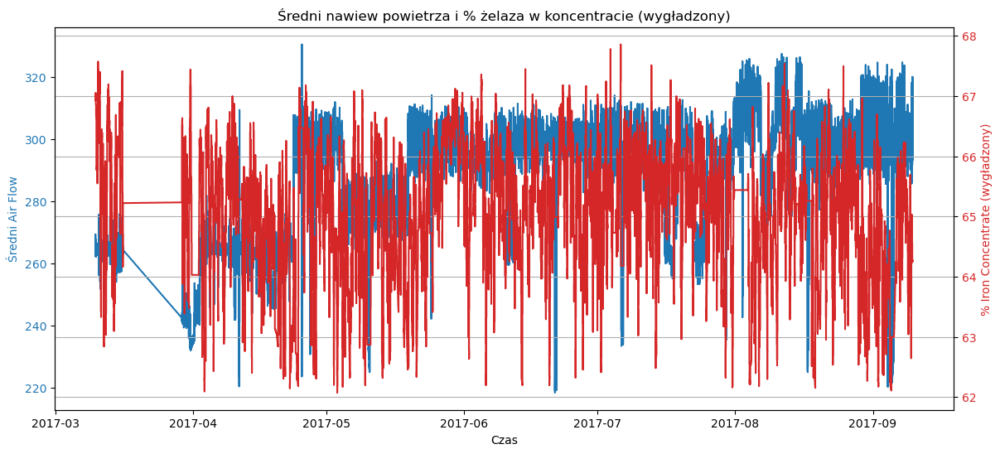

In [55]:
window_size = 200  # większe okno wygładzania, dostosuj do ilości próbek i rozdzielczości czasowej
pandas_df['%_Iron_Concentrate_smooth'] = pandas_df['%_Iron_Concentrate'].rolling(window=window_size, center=True).mean()
fig, ax1 = plt.subplots(figsize=(14,6))

color_airflow = 'tab:blue'
ax1.set_xlabel('Czas')
ax1.set_ylabel('Średni Air Flow', color=color_airflow)
ax1.plot(pandas_df['date'], pandas_df['Airflow_Mean'], color=color_airflow)
ax1.tick_params(axis='y', labelcolor=color_airflow)

ax2 = ax1.twinx()
color_iron = 'tab:red'
ax2.set_ylabel('% Iron Concentrate (wygładzony)', color=color_iron)
ax2.plot(pandas_df['date'], pandas_df['%_Iron_Concentrate_smooth'], color=color_iron)
ax2.tick_params(axis='y', labelcolor=color_iron)

plt.title('Średni nawiew powietrza i % żelaza w koncentracie (wygładzony)')
plt.grid(True)
plt.show()


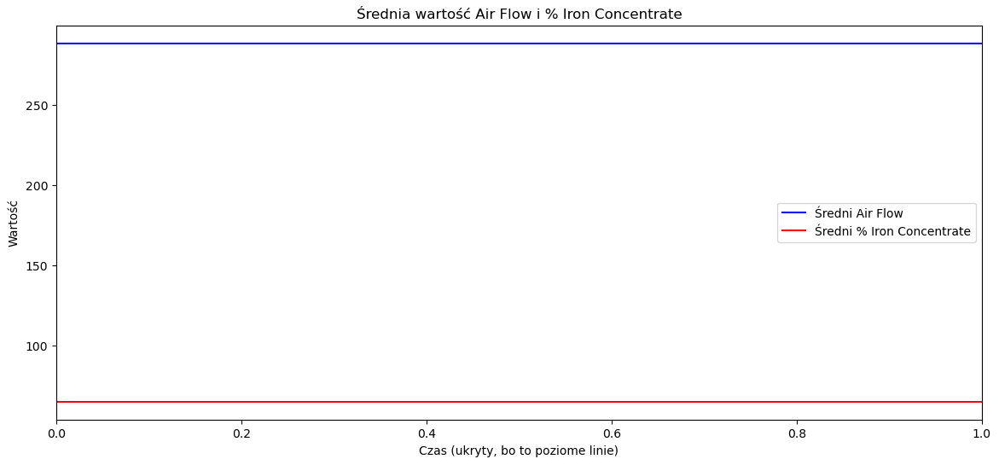

In [56]:
mean_airflow = pandas_df['Airflow_Mean'].mean()
mean_iron = pandas_df['%_Iron_Concentrate'].mean()

fig, ax = plt.subplots(figsize=(14,6))

# Narysuj średni nawiew powietrza jako poziomą linię
ax.axhline(mean_airflow, color='blue', label='Średni Air Flow')

# Narysuj średni % żelaza jako poziomą linię
ax.axhline(mean_iron, color='red', label='Średni % Iron Concentrate')

ax.set_xlabel('Czas (ukryty, bo to poziome linie)')
ax.set_ylabel('Wartość')
ax.set_title('Średnia wartość Air Flow i % Iron Concentrate')
ax.legend()
plt.show()


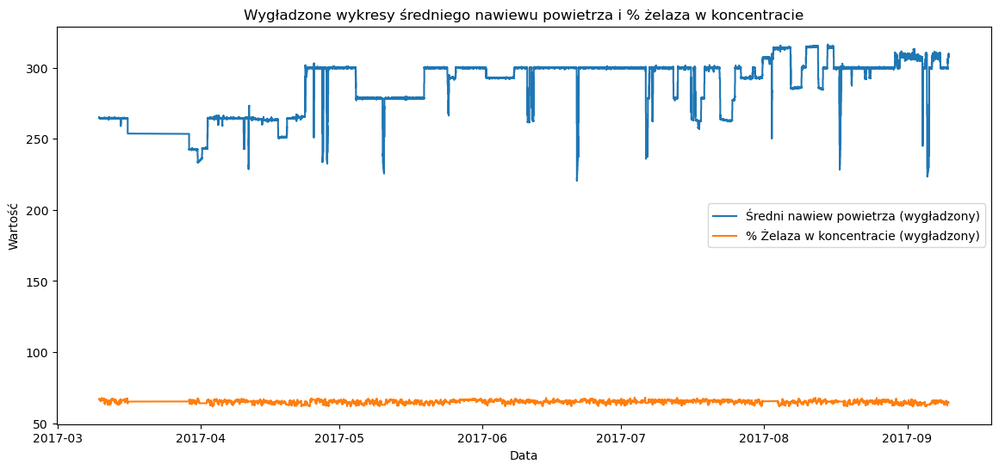

In [57]:
window_size = 100  # liczba próbek do uśrednienia, możesz zmienić

pandas_df['Airflow_Mean_Smooth'] = pandas_df[['Flotation_Column_01_Air_Flow',
                                              'Flotation_Column_02_Air_Flow',
                                              'Flotation_Column_03_Air_Flow',
                                              'Flotation_Column_04_Air_Flow',
                                              'Flotation_Column_05_Air_Flow',
                                              'Flotation_Column_06_Air_Flow',
                                              'Flotation_Column_07_Air_Flow']].mean(axis=1)

# wygładzamy
pandas_df['Airflow_Mean_Smooth'] = pandas_df['Airflow_Mean_Smooth'].rolling(window=window_size, center=True).mean()
pandas_df['Iron_Concentrate_Smooth'] = pandas_df['%_Iron_Concentrate'].rolling(window=window_size, center=True).mean()

import matplotlib.pyplot as plt

plt.figure(figsize=(14,6))
plt.plot(pandas_df['date'], pandas_df['Airflow_Mean_Smooth'], label='Średni nawiew powietrza (wygładzony)')
plt.plot(pandas_df['date'], pandas_df['Iron_Concentrate_Smooth'], label='% Żelaza w koncentracie (wygładzony)')
plt.xlabel('Data')
plt.ylabel('Wartość')
plt.title('Wygładzone wykresy średniego nawiewu powietrza i % żelaza w koncentracie')
plt.legend()
plt.show()


/tmp/ipykernel_684/3360557454.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  smooth_df['Airflow_Scaled'] = scaled[:,0]
/tmp/ipykernel_684/3360557454.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  smooth_df['Iron_Scaled'] = scaled[:,1]


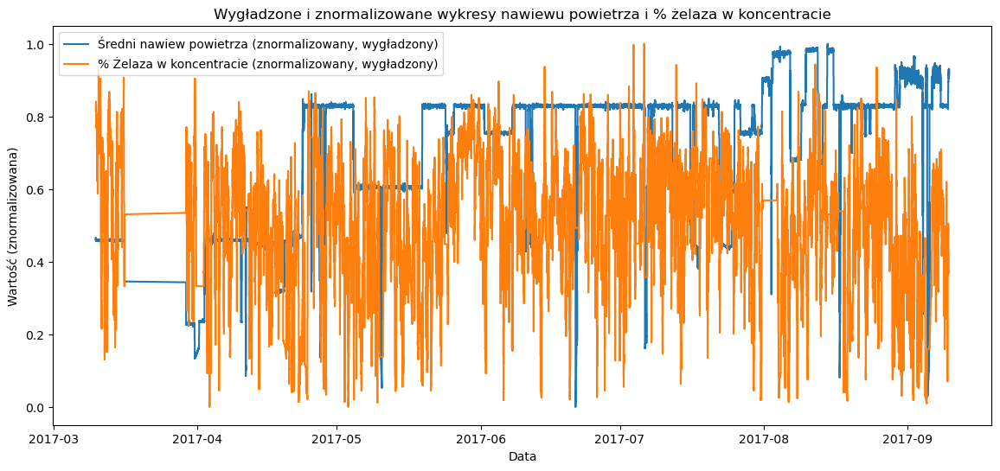

In [59]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

window_size = 100

# Obliczamy średni nawiew
pandas_df['Airflow_Mean'] = pandas_df[['Flotation_Column_01_Air_Flow',
                                       'Flotation_Column_02_Air_Flow',
                                       'Flotation_Column_03_Air_Flow',
                                       'Flotation_Column_04_Air_Flow',
                                       'Flotation_Column_05_Air_Flow',
                                       'Flotation_Column_06_Air_Flow',
                                       'Flotation_Column_07_Air_Flow']].mean(axis=1)

# Wygładzamy średni nawiew i % żelaza
pandas_df['Airflow_Mean_Smooth'] = pandas_df['Airflow_Mean'].rolling(window=window_size, center=True).mean()
pandas_df['Iron_Concentrate_Smooth'] = pandas_df['%_Iron_Concentrate'].rolling(window=window_size, center=True).mean()

# Usuwamy NaN powstałe po rolling
smooth_df = pandas_df.dropna(subset=['Airflow_Mean_Smooth', 'Iron_Concentrate_Smooth'])

# Normalizacja do zakresu 0-1
scaler = MinMaxScaler()
scaled = scaler.fit_transform(smooth_df[['Airflow_Mean_Smooth', 'Iron_Concentrate_Smooth']])
smooth_df['Airflow_Scaled'] = scaled[:,0]
smooth_df['Iron_Scaled'] = scaled[:,1]

plt.figure(figsize=(14,6))
plt.plot(smooth_df['date'], smooth_df['Airflow_Scaled'], label='Średni nawiew powietrza (znormalizowany, wygładzony)')
plt.plot(smooth_df['date'], smooth_df['Iron_Scaled'], label='% Żelaza w koncentracie (znormalizowany, wygładzony)')
plt.xlabel('Data')
plt.ylabel('Wartość (znormalizowana)')
plt.title('Wygładzone i znormalizowane wykresy nawiewu powietrza i % żelaza w koncentracie')
plt.legend()
plt.show()


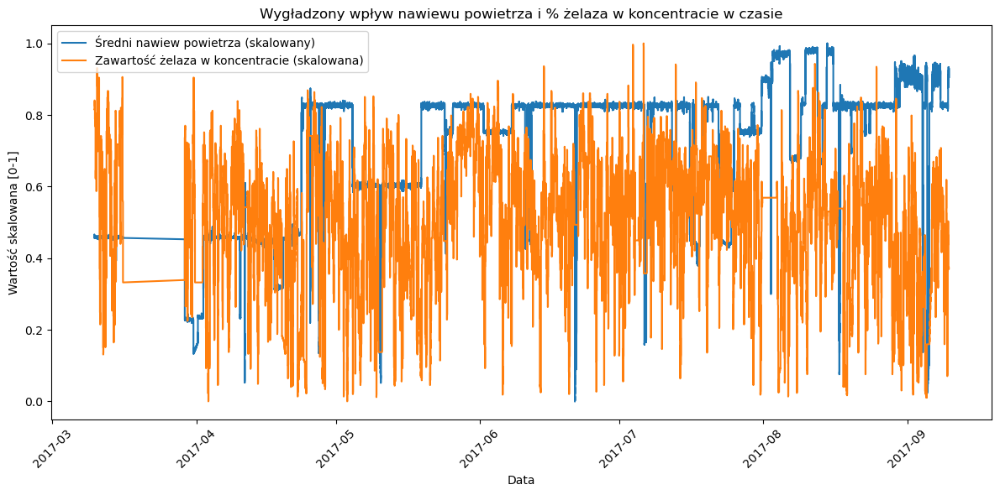

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Przykład wygładzania
window_size = 60  # np. 60 minut

pandas_df['Airflow_Mean_Smooth'] = pandas_df['Airflow_Mean'].rolling(window=window_size, min_periods=1).mean()
pandas_df['%_Iron_Concentrate_Smooth'] = pandas_df['%_Iron_Concentrate'].rolling(window=window_size, min_periods=1).mean()

# Usuń wiersze z brakami w tych kolumnach i kopiuj
smooth_df = pandas_df.dropna(subset=['Airflow_Mean_Smooth', '%_Iron_Concentrate_Smooth']).copy()

# Skalowanie do [0,1]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(smooth_df[['Airflow_Mean_Smooth', '%_Iron_Concentrate_Smooth']])

smooth_df['Airflow_Scaled'] = scaled[:, 0]
smooth_df['Iron_Scaled'] = scaled[:, 1]

# Wykres
plt.figure(figsize=(12,6))
plt.plot(smooth_df['date'], smooth_df['Airflow_Scaled'], label='Średni nawiew powietrza (skalowany)')
plt.plot(smooth_df['date'], smooth_df['Iron_Scaled'], label='Zawartość żelaza w koncentracie (skalowana)')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.title('Wygładzony wpływ nawiewu powietrza i % żelaza w koncentracie w czasie')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


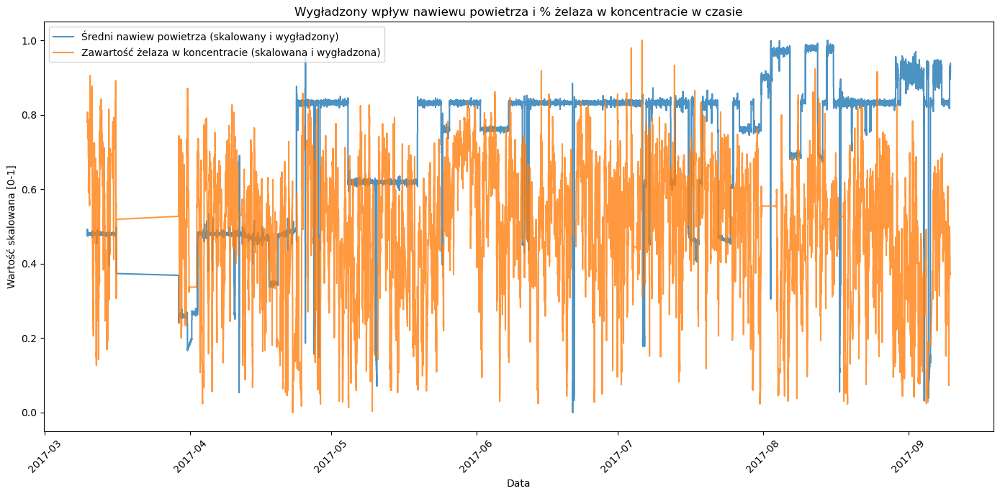

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# Załóż, że masz pandas_df z kolumnami: 'date', 'Airflow_Mean', '%_Iron_Concentrate'
# Upewnij się, że 'date' jest w datetime
pandas_df['date'] = pd.to_datetime(pandas_df['date'])
pandas_df = pandas_df.sort_values('date').reset_index(drop=True)

# Usuń braki
pandas_df = pandas_df.dropna(subset=['Airflow_Mean', '%_Iron_Concentrate']).copy()

# Parametry filtra Savitzky-Golay
window_length = 101  # musi być nieparzysta i dostosowana do długości danych
polyorder = 3

# Wygładzenie
pandas_df['Iron_Smooth'] = savgol_filter(pandas_df['%_Iron_Concentrate'], window_length, polyorder)
pandas_df['Airflow_Smooth'] = savgol_filter(pandas_df['Airflow_Mean'], window_length, polyorder)

# Skalowanie do [0,1]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(pandas_df[['Airflow_Smooth', 'Iron_Smooth']])
pandas_df['Airflow_Scaled'] = scaled[:, 0]
pandas_df['Iron_Scaled'] = scaled[:, 1]

# Rysowanie wykresu
plt.figure(figsize=(14,7))
plt.plot(pandas_df['date'], pandas_df['Airflow_Scaled'], label='Średni nawiew powietrza (skalowany i wygładzony)', alpha=0.8)
plt.plot(pandas_df['date'], pandas_df['Iron_Scaled'], label='Zawartość żelaza w koncentracie (skalowana i wygładzona)', alpha=0.8)
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.title('Wygładzony wpływ nawiewu powietrza i % żelaza w koncentracie w czasie')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


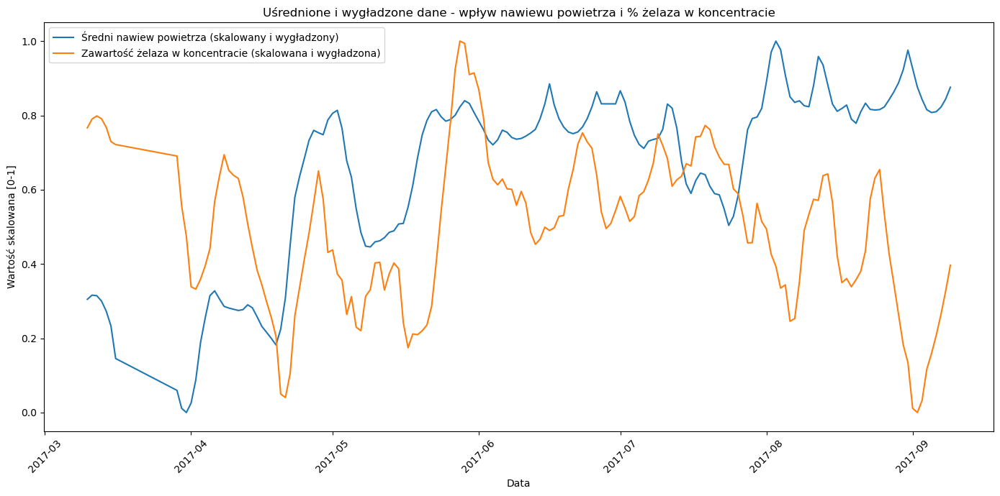

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# Zakładam, że pandas_df['date'] jest już w datetime
pandas_df = pandas_df.sort_values('date').reset_index(drop=True)

# Ustawiamy 'date' jako indeks (ułatwia grupowanie)
pandas_df.set_index('date', inplace=True)

# Grupowanie i uśrednianie co np. 1 dzień
resampled_df = pandas_df.resample('1D').mean()

# Możemy też spróbować co godzinę: resample('1H').mean()

# Usuwamy potencjalne NaN-y po resamplingu
resampled_df = resampled_df.dropna(subset=['Airflow_Mean', '%_Iron_Concentrate'])

# Wygładzamy (możesz pominąć, bo uśrednianie już mocno wygładza)
window_length = 11  # mniejsze okno bo dane rzadsze
polyorder = 2
resampled_df['Iron_Smooth'] = savgol_filter(resampled_df['%_Iron_Concentrate'], window_length, polyorder)
resampled_df['Airflow_Smooth'] = savgol_filter(resampled_df['Airflow_Mean'], window_length, polyorder)

# Skalowanie do [0,1]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(resampled_df[['Airflow_Smooth', 'Iron_Smooth']])
resampled_df['Airflow_Scaled'] = scaled[:, 0]
resampled_df['Iron_Scaled'] = scaled[:, 1]

# Wykres
plt.figure(figsize=(14,7))
plt.plot(resampled_df.index, resampled_df['Airflow_Scaled'], label='Średni nawiew powietrza (skalowany i wygładzony)')
plt.plot(resampled_df.index, resampled_df['Iron_Scaled'], label='Zawartość żelaza w koncentracie (skalowana i wygładzona)')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.title('Uśrednione i wygładzone dane - wpływ nawiewu powietrza i % żelaza w koncentracie')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


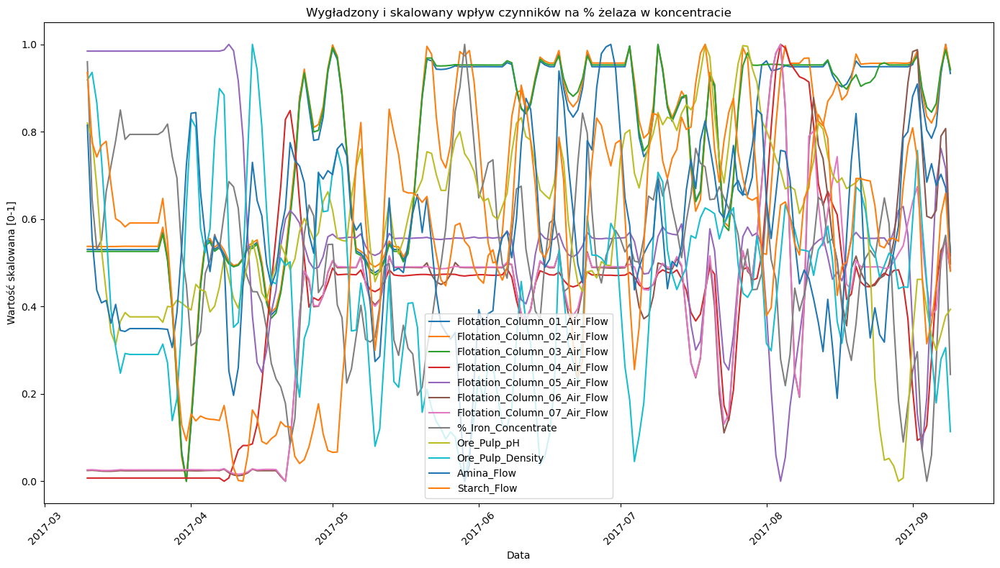

In [70]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# --- 1. Wczytanie danych ---
pandas_df = pd.read_csv('quality-prediction.csv')

# --- 2. Konwersja kolumn (zamiana ',' na '.' i float) ---
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# --- 3. Konwersja daty z podanym formatem ---
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Usuń wiersze bez poprawnej daty
pandas_df = pandas_df.dropna(subset=['date'])

# --- 4. Ustawienie daty jako indeks ---
pandas_df = pandas_df.set_index('date').sort_index()

# --- 5. Grupowanie i uśrednianie po dniach ---
daily_df = pandas_df.resample('1D').mean()

# --- 6. Wygładzanie wybranych kolumn ---
cols_to_smooth = [
    'Flotation_Column_01_Air_Flow', 'Flotation_Column_02_Air_Flow', 'Flotation_Column_03_Air_Flow',
    'Flotation_Column_04_Air_Flow', 'Flotation_Column_05_Air_Flow', 'Flotation_Column_06_Air_Flow',
    'Flotation_Column_07_Air_Flow',
    '%_Iron_Concentrate',
    'Ore_Pulp_pH', 'Ore_Pulp_Density', 'Amina_Flow', 'Starch_Flow'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- 7. Skalowanie do [0,1] dla wykresu ---
scaler = MinMaxScaler()
scaled = scaler.fit_transform(daily_df[[col + '_Smooth' for col in cols_to_smooth]])
scaled_df = pd.DataFrame(scaled, index=daily_df.index, columns=[col + '_Scaled' for col in cols_to_smooth])

# --- 8. Wykres ---
plt.figure(figsize=(14, 8))
for col in cols_to_smooth:
    plt.plot(scaled_df.index, scaled_df[col + '_Scaled'], label=col)

plt.title('Wygładzony i skalowany wpływ czynników na % żelaza w koncentracie')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


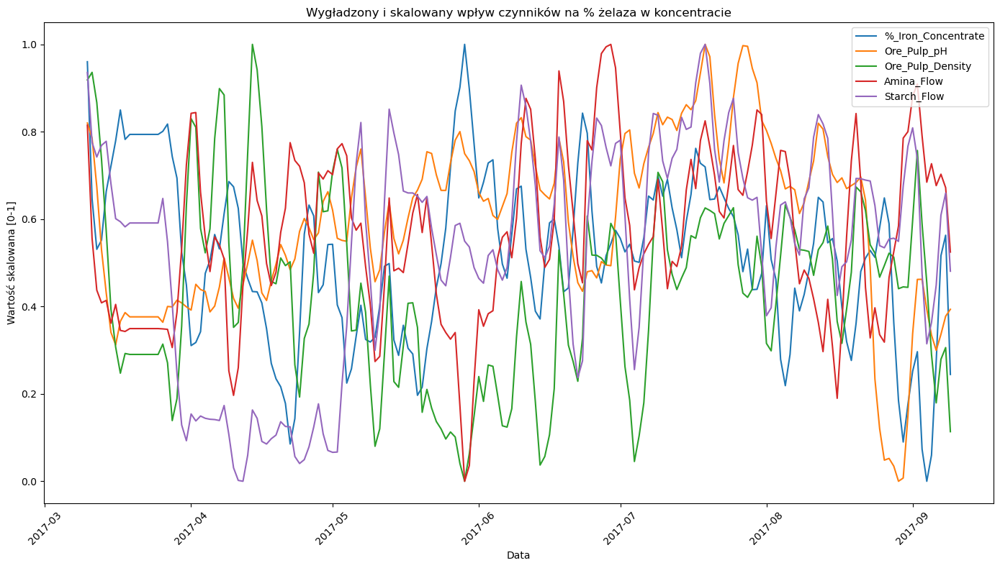

In [71]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# --- 1. Wczytanie danych ---
pandas_df = pd.read_csv('quality-prediction.csv')

# --- 2. Konwersja kolumn (zamiana ',' na '.' i float) ---
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# --- 3. Konwersja daty z podanym formatem ---
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Usuń wiersze bez poprawnej daty
pandas_df = pandas_df.dropna(subset=['date'])

# --- 4. Ustawienie daty jako indeks ---
pandas_df = pandas_df.set_index('date').sort_index()

# --- 5. Grupowanie i uśrednianie po dniach ---
daily_df = pandas_df.resample('1D').mean()

# --- 6. Wygładzanie wybranych kolumn ---
cols_to_smooth = [
    '%_Iron_Concentrate',
    'Ore_Pulp_pH', 'Ore_Pulp_Density', 'Amina_Flow', 'Starch_Flow'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- 7. Skalowanie do [0,1] dla wykresu ---
scaler = MinMaxScaler()
scaled = scaler.fit_transform(daily_df[[col + '_Smooth' for col in cols_to_smooth]])
scaled_df = pd.DataFrame(scaled, index=daily_df.index, columns=[col + '_Scaled' for col in cols_to_smooth])

# --- 8. Wykres ---
plt.figure(figsize=(14, 8))
for col in cols_to_smooth:
    plt.plot(scaled_df.index, scaled_df[col + '_Scaled'], label=col)

plt.title('Wygładzony i skalowany wpływ czynników na % żelaza w koncentracie')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

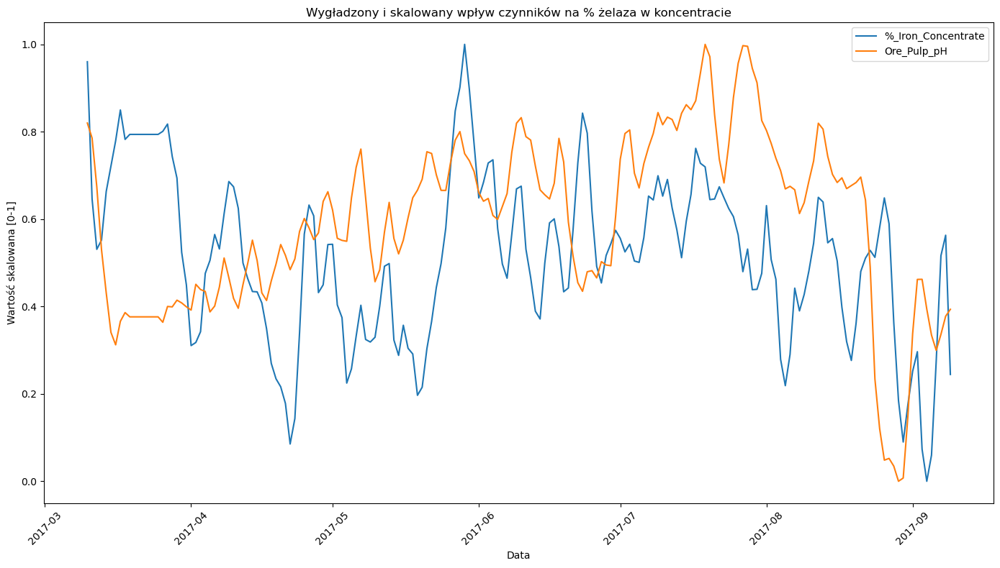

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# --- 1. Wczytanie danych ---
pandas_df = pd.read_csv('quality-prediction.csv')

# --- 2. Konwersja kolumn (zamiana ',' na '.' i float) ---
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# --- 3. Konwersja daty z podanym formatem ---
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Usuń wiersze bez poprawnej daty
pandas_df = pandas_df.dropna(subset=['date'])

# --- 4. Ustawienie daty jako indeks ---
pandas_df = pandas_df.set_index('date').sort_index()

# --- 5. Grupowanie i uśrednianie po dniach ---
daily_df = pandas_df.resample('1D').mean()

# --- 6. Wygładzanie wybranych kolumn ---
cols_to_smooth = [
    '%_Iron_Concentrate',
    'Ore_Pulp_pH'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- 7. Skalowanie do [0,1] dla wykresu ---
scaler = MinMaxScaler()
scaled = scaler.fit_transform(daily_df[[col + '_Smooth' for col in cols_to_smooth]])
scaled_df = pd.DataFrame(scaled, index=daily_df.index, columns=[col + '_Scaled' for col in cols_to_smooth])

# --- 8. Wykres ---
plt.figure(figsize=(14, 8))
for col in cols_to_smooth:
    plt.plot(scaled_df.index, scaled_df[col + '_Scaled'], label=col)

plt.title('Wygładzony i skalowany wpływ czynników na % żelaza w koncentracie')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

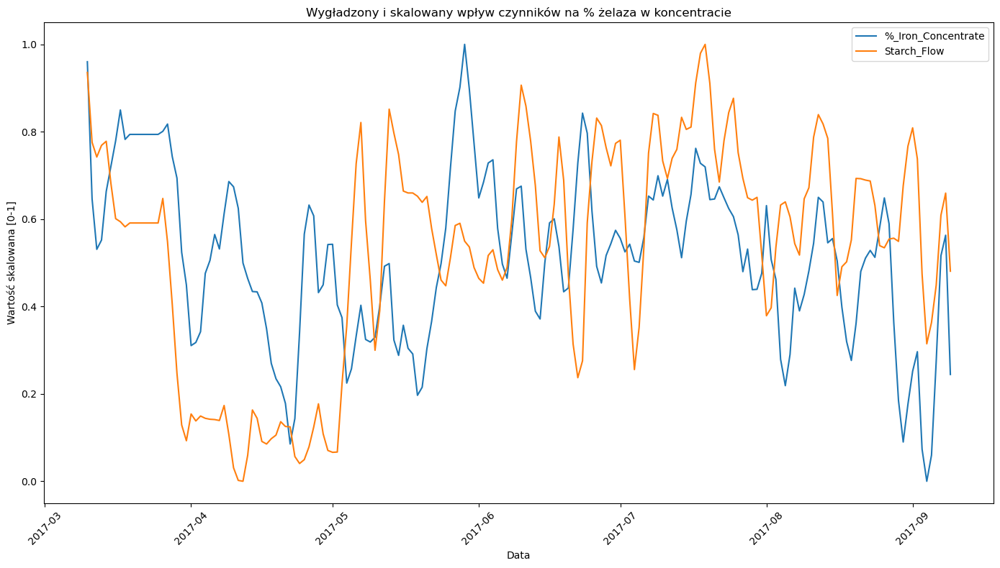

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# --- 1. Wczytanie danych ---
pandas_df = pd.read_csv('quality-prediction.csv')

# --- 2. Konwersja kolumn (zamiana ',' na '.' i float) ---
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# --- 3. Konwersja daty z podanym formatem ---
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Usuń wiersze bez poprawnej daty
pandas_df = pandas_df.dropna(subset=['date'])

# --- 4. Ustawienie daty jako indeks ---
pandas_df = pandas_df.set_index('date').sort_index()

# --- 5. Grupowanie i uśrednianie po dniach ---
daily_df = pandas_df.resample('1D').mean()

# --- 6. Wygładzanie wybranych kolumn ---
cols_to_smooth = [
    '%_Iron_Concentrate',
    'Starch_Flow'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- 7. Skalowanie do [0,1] dla wykresu ---
scaler = MinMaxScaler()
scaled = scaler.fit_transform(daily_df[[col + '_Smooth' for col in cols_to_smooth]])
scaled_df = pd.DataFrame(scaled, index=daily_df.index, columns=[col + '_Scaled' for col in cols_to_smooth])

# --- 8. Wykres ---
plt.figure(figsize=(14, 8))
for col in cols_to_smooth:
    plt.plot(scaled_df.index, scaled_df[col + '_Scaled'], label=col)

plt.title('Wygładzony i skalowany wpływ czynników na % żelaza w koncentracie')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

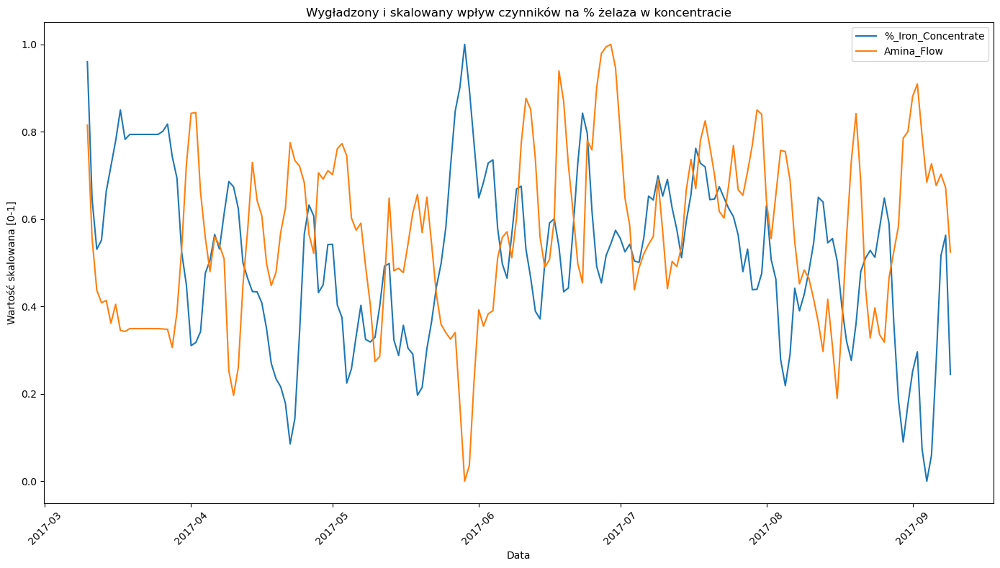

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# --- 1. Wczytanie danych ---
pandas_df = pd.read_csv('quality-prediction.csv')

# --- 2. Konwersja kolumn (zamiana ',' na '.' i float) ---
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# --- 3. Konwersja daty z podanym formatem ---
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Usuń wiersze bez poprawnej daty
pandas_df = pandas_df.dropna(subset=['date'])

# --- 4. Ustawienie daty jako indeks ---
pandas_df = pandas_df.set_index('date').sort_index()

# --- 5. Grupowanie i uśrednianie po dniach ---
daily_df = pandas_df.resample('1D').mean()

# --- 6. Wygładzanie wybranych kolumn ---
cols_to_smooth = [
    '%_Iron_Concentrate',
    'Amina_Flow'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- 7. Skalowanie do [0,1] dla wykresu ---
scaler = MinMaxScaler()
scaled = scaler.fit_transform(daily_df[[col + '_Smooth' for col in cols_to_smooth]])
scaled_df = pd.DataFrame(scaled, index=daily_df.index, columns=[col + '_Scaled' for col in cols_to_smooth])

# --- 8. Wykres ---
plt.figure(figsize=(14, 8))
for col in cols_to_smooth:
    plt.plot(scaled_df.index, scaled_df[col + '_Scaled'], label=col)

plt.title('Wygładzony i skalowany wpływ czynników na % żelaza w koncentracie')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

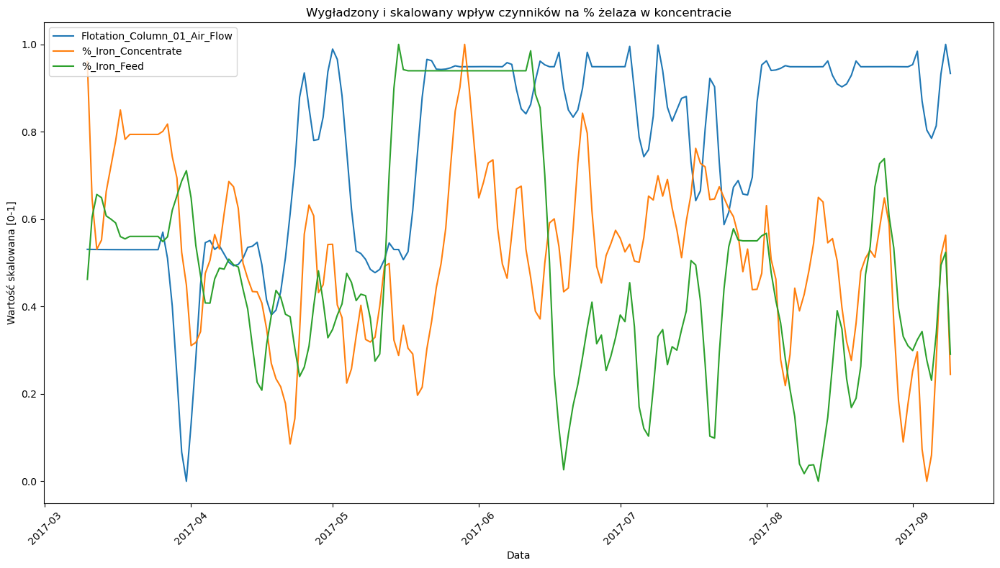

In [78]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# --- 1. Wczytanie danych ---
pandas_df = pd.read_csv('quality-prediction.csv')

# --- 2. Konwersja kolumn (zamiana ',' na '.' i float) ---
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# --- 3. Konwersja daty z podanym formatem ---
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Usuń wiersze bez poprawnej daty
pandas_df = pandas_df.dropna(subset=['date'])

# --- 4. Ustawienie daty jako indeks ---
pandas_df = pandas_df.set_index('date').sort_index()

# --- 5. Grupowanie i uśrednianie po dniach ---
daily_df = pandas_df.resample('1D').mean()

# --- 6. Wygładzanie wybranych kolumn ---
cols_to_smooth = [
    'Flotation_Column_01_Air_Flow', 
    '%_Iron_Concentrate','%_Iron_Feed',
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- 7. Skalowanie do [0,1] dla wykresu ---
scaler = MinMaxScaler()
scaled = scaler.fit_transform(daily_df[[col + '_Smooth' for col in cols_to_smooth]])
scaled_df = pd.DataFrame(scaled, index=daily_df.index, columns=[col + '_Scaled' for col in cols_to_smooth])

# --- 8. Wykres ---
plt.figure(figsize=(14, 8))
for col in cols_to_smooth:
    plt.plot(scaled_df.index, scaled_df[col + '_Scaled'], label=col)

plt.title('Wygładzony i skalowany wpływ czynników na % żelaza w koncentracie')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

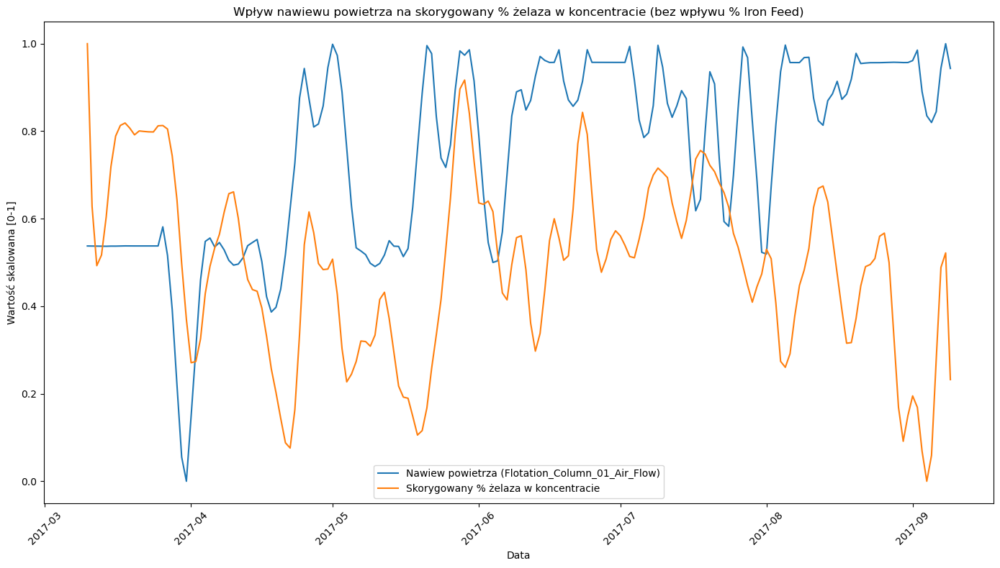

In [84]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
import numpy as np

# --- 1-7. Jak masz ---
pandas_df = pd.read_csv('quality-prediction.csv')

for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')
pandas_df = pandas_df.dropna(subset=['date']).set_index('date').sort_index()
daily_df = pandas_df.resample('1D').mean()

cols_to_smooth = ['Flotation_Column_01_Air_Flow', 'Flotation_Column_02_Air_Flow', '%_Iron_Concentrate', '%_Iron_Feed']
for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- Usunięcie wpływu %_Iron_Feed na %_Iron_Concentrate ---

X = daily_df[['%_Iron_Feed_Smooth']].values.reshape(-1,1)
y = daily_df['%_Iron_Concentrate_Smooth'].values

model = LinearRegression()
model.fit(X, y)

# Predykcja koncentratu bazując na feedzie
y_pred = model.predict(X)

# Reszty - koncentrat "oczyszczony" z wpływu feed
daily_df['Iron_Concentrate_Corrected'] = y - y_pred

# Wygładzenie poprawionego koncentratu, żeby nie było szumu
daily_df['Iron_Concentrate_Corrected_Smooth'] = savgol_filter(
    daily_df['Iron_Concentrate_Corrected'].fillna(method='ffill').fillna(method='bfill'),
    window_length=7, polyorder=3)

# --- Skalowanie do wykresu ---
scaler = MinMaxScaler()
scaled = scaler.fit_transform(daily_df[['Flotation_Column_02_Air_Flow_Smooth', 'Iron_Concentrate_Corrected_Smooth']])
scaled_df = pd.DataFrame(scaled, index=daily_df.index, columns=['Airflow_Scaled', 'Iron_Concentrate_Corrected_Scaled'])

# --- Wykres ---
plt.figure(figsize=(14, 8))
plt.plot(scaled_df.index, scaled_df['Airflow_Scaled'], label='Nawiew powietrza (Flotation_Column_01_Air_Flow)')
plt.plot(scaled_df.index, scaled_df['Iron_Concentrate_Corrected_Scaled'], label='Skorygowany % żelaza w koncentracie')

plt.title('Wpływ nawiewu powietrza na skorygowany % żelaza w koncentracie (bez wpływu % Iron Feed)')
plt.xlabel('Data')
plt.ylabel('Wartość skalowana [0-1]')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Mean Squared Error: 0.2498
R^2 Score: 0.2699
                               Feature  Coefficient
0  Flotation_Column_01_Air_Flow_Smooth     0.000532
1                   Ore_Pulp_pH_Smooth     0.389540
2              Ore_Pulp_Density_Smooth     4.283527
3                    Amina_Flow_Smooth    -0.008369
4                   Starch_Flow_Smooth     0.000256


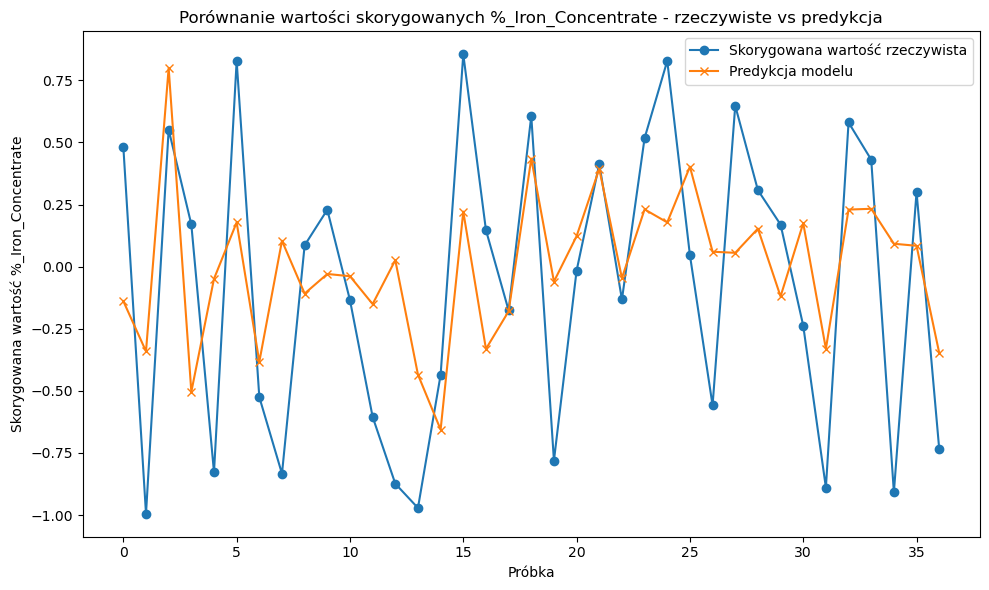

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# 1. Wczytanie danych
pandas_df = pd.read_csv('quality-prediction.csv')

# 2. Konwersja kolumn (zamiana ',' na '.' i na float)
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# 3. Konwersja daty
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Usunięcie wierszy bez poprawnej daty
pandas_df = pandas_df.dropna(subset=['date'])

# 4. Ustawienie daty jako indeks i sortowanie
pandas_df = pandas_df.set_index('date').sort_index()

# 5. Grupowanie po dniach i uśrednianie
daily_df = pandas_df.resample('1D').mean()

# 6. Wygładzanie kolumn (ważne cechy)
cols_to_smooth = [
    'Flotation_Column_01_Air_Flow',
    '%_Iron_Concentrate',
    '%_Iron_Feed',
    'Ore_Pulp_pH',
    'Ore_Pulp_Density',
    'Amina_Flow',
    'Starch_Flow'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# 7. Usunięcie wpływu %_Iron_Feed na %_Iron_Concentrate
X = daily_df[['%_Iron_Feed_Smooth']].values.reshape(-1, 1)
y = daily_df['%_Iron_Concentrate_Smooth'].values

model_feed = LinearRegression()
model_feed.fit(X, y)
y_pred_feed = model_feed.predict(X)

# Reszta (residual) to skorygowana wartość %_Iron_Concentrate
daily_df['Iron_Concentrate_Corrected'] = y - y_pred_feed

# 8. Przygotowanie cech do modelu regresji liniowej (wybierz wygładzone kolumny oprócz %_Iron_Feed i %_Iron_Concentrate)
feature_cols = [
    'Flotation_Column_01_Air_Flow_Smooth',
    'Ore_Pulp_pH_Smooth',
    'Ore_Pulp_Density_Smooth',
    'Amina_Flow_Smooth',
    'Starch_Flow_Smooth'
]

# Przygotuj macierz cech i zmienną celu
X = daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill').values
y = daily_df['Iron_Concentrate_Corrected'].fillna(0).values  # 0 zamiast NaN dla bezpieczeństwa

# Podział na trening i test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 9. Model regresji liniowej
model = LinearRegression()
model.fit(X_train, y_train)

# Predykcja
y_pred = model.predict(X_test)

# Ocena modelu
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R^2 Score: {r2:.4f}')

# Współczynniki regresji
coeff_df = pd.DataFrame({
    'Feature': feature_cols,
    'Coefficient': model.coef_
})
print(coeff_df)

# 10. Wykres porównawczy oryginału i predykcji na zbiorze testowym
plt.figure(figsize=(10,6))
plt.plot(y_test, label='Skorygowana wartość rzeczywista', marker='o')
plt.plot(y_pred, label='Predykcja modelu', marker='x')
plt.title('Porównanie wartości skorygowanych %_Iron_Concentrate - rzeczywiste vs predykcja')
plt.xlabel('Próbka')
plt.ylabel('Skorygowana wartość %_Iron_Concentrate')
plt.legend()
plt.tight_layout()
plt.show()


In [87]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from scipy.stats import t
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter

# --- 1. Wczytanie danych ---
pandas_df = pd.read_csv('quality-prediction.csv')

# --- 2. Konwersja kolumn (zamiana ',' na '.' i float) ---
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# --- 3. Konwersja daty ---
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')
pandas_df = pandas_df.dropna(subset=['date'])
pandas_df = pandas_df.set_index('date').sort_index()

# --- 4. Grupowanie i uśrednianie po dniach ---
daily_df = pandas_df.resample('1D').mean()

# --- 5. Wygładzanie wybranych kolumn ---
cols_to_smooth = [
    'Flotation_Column_01_Air_Flow', 
    'Ore_Pulp_pH',
    'Ore_Pulp_Density',
    'Amina_Flow',
    'Starch_Flow',
    '%_Iron_Feed',
    '%_Iron_Concentrate'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(daily_df[col].fillna(method='ffill').fillna(method='bfill'), window_length=7, polyorder=3)

# --- 6. Korekcja %_Iron_Concentrate względem %_Iron_Feed ---
from sklearn.linear_model import LinearRegression

X_feed = daily_df['%_Iron_Feed_Smooth'].values.reshape(-1, 1)
y_conc = daily_df['%_Iron_Concentrate_Smooth'].values

model_corr = LinearRegression()
model_corr.fit(X_feed, y_conc)
y_pred_corr = model_corr.predict(X_feed)

daily_df['Iron_Concentrate_Corrected'] = y_conc - y_pred_corr

# --- 7. Przygotowanie danych do regresji ---
feature_cols = [
    'Flotation_Column_01_Air_Flow_Smooth',
    'Ore_Pulp_pH_Smooth',
    'Ore_Pulp_Density_Smooth',
    'Amina_Flow_Smooth',
    'Starch_Flow_Smooth'
]

X = daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill').values
y = daily_df['Iron_Concentrate_Corrected']

# --- 8. Dopasowanie modelu regresji liniowej ---
model = LinearRegression()
model.fit(X, y)

# --- 9. Obliczenie statystyk t-test dla współczynników ---

# liczba próbek i liczba cech
n = X.shape[0]
p = X.shape[1]

# predykcje modelu i residuals
y_pred = model.predict(X)
residuals = y - y_pred

# estymacja wariancji resztowej
RSS = np.sum(residuals**2)
sigma_squared = RSS / (n - p - 1)

# obliczenie macierzy kowariancji
X_design = np.hstack([np.ones((n, 1)), X])  # dodanie kolumny jedynek dla interceptu
cov_matrix = sigma_squared * np.linalg.inv(X_design.T.dot(X_design))

# odchylenia standardowe współczynników (pierwszy to intercept)
se = np.sqrt(np.diag(cov_matrix))

# współczynniki regresji z interceptem
coefs = np.hstack([model.intercept_, model.coef_])

# statystyki t
t_stats = coefs / se

# dwustronne p-wartości
p_values = [2 * (1 - t.cdf(np.abs(t_val), df=n - p - 1)) for t_val in t_stats]

# --- 10. Wyświetlenie wyników ---
results_df = pd.DataFrame({
    'Feature': ['Intercept'] + feature_cols,
    'Coefficient': coefs,
    'Std Error': se,
    't Stat': t_stats,
    'p Value': p_values
})

print(results_df)


                               Feature  Coefficient  Std Error    t Stat  \
0                            Intercept    -7.348353   2.814259 -2.611115   
1  Flotation_Column_01_Air_Flow_Smooth     0.000643   0.001588  0.404908   
2                   Ore_Pulp_pH_Smooth     0.367795   0.143726  2.559010   
3              Ore_Pulp_Density_Smooth     4.323105   1.552130  2.785272   
4                    Amina_Flow_Smooth    -0.008951   0.001206 -7.424532   
5                   Starch_Flow_Smooth     0.000232   0.000070  3.306009   

        p Value  
0  9.794589e-03  
1  6.860316e-01  
2  1.132901e-02  
3  5.927477e-03  
4  4.507728e-12  
5  1.144621e-03  


Mean Squared Error: 0.2425
R^2 Score: 0.2968
                               Feature  Coefficient
0  Flotation_Column_01_Air_Flow_Smooth     0.000191
1                   %_Iron_Feed_Smooth     0.013876
2                   Ore_Pulp_pH_Smooth     0.398044
3              Ore_Pulp_Density_Smooth     3.575557
4                    Amina_Flow_Smooth    -0.008459
5                   Starch_Flow_Smooth     0.000266


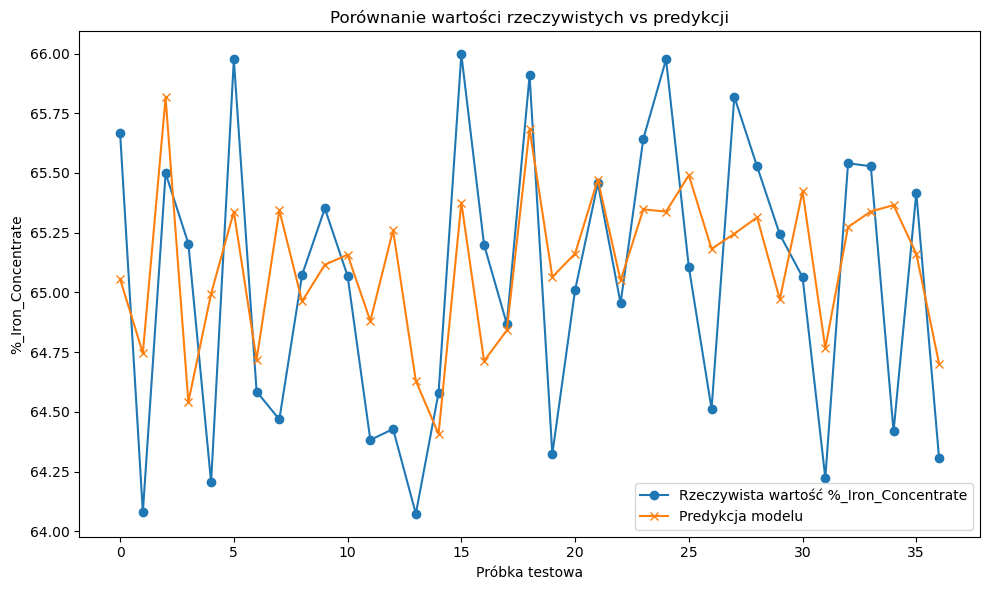

                                                                 Feature  \
const                                                          Intercept   
Flotation_Column_01_Air_Flow_Smooth  Flotation_Column_01_Air_Flow_Smooth   
%_Iron_Feed_Smooth                                    %_Iron_Feed_Smooth   
Ore_Pulp_pH_Smooth                                    Ore_Pulp_pH_Smooth   
Ore_Pulp_Density_Smooth                          Ore_Pulp_Density_Smooth   
Amina_Flow_Smooth                                      Amina_Flow_Smooth   
Starch_Flow_Smooth                                    Starch_Flow_Smooth   

                                     Coefficient  Std Error     t Stat  \
const                                  58.878150   3.228078  18.239381   
Flotation_Column_01_Air_Flow_Smooth     0.000166   0.001612   0.102808   
%_Iron_Feed_Smooth                      0.009650   0.009410   1.025541   
Ore_Pulp_pH_Smooth                      0.372715   0.143203   2.602701   
Ore_Pulp_Density_Smoo

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

# 1. Wczytanie danych
pandas_df = pd.read_csv('quality-prediction.csv')

# 2. Zamiana przecinków na kropki i konwersja na float
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# 3. Konwersja daty
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')
pandas_df = pandas_df.dropna(subset=['date'])  # usuń wiersze z błędną datą

# 4. Ustawienie indeksu i sortowanie
pandas_df = pandas_df.set_index('date').sort_index()

# 5. Grupowanie dzienne
daily_df = pandas_df.resample('1D').mean()

# 6. Wygładzanie kolumn
cols_to_smooth = [
    'Flotation_Column_01_Air_Flow',
    '%_Iron_Concentrate',
    '%_Iron_Feed',
    'Ore_Pulp_pH',
    'Ore_Pulp_Density',
    'Amina_Flow',
    'Starch_Flow'
]

for col in cols_to_smooth:
    daily_df[col + '_Smooth'] = savgol_filter(
        daily_df[col].fillna(method='ffill').fillna(method='bfill'),
        window_length=7, polyorder=3
    )

# 7. Wybór cech (zawiera %_Iron_Feed_Smooth)
feature_cols = [
    'Flotation_Column_01_Air_Flow_Smooth',
    '%_Iron_Feed_Smooth',
    'Ore_Pulp_pH_Smooth',
    'Ore_Pulp_Density_Smooth',
    'Amina_Flow_Smooth',
    'Starch_Flow_Smooth'
]

X = daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill').values
y = daily_df['%_Iron_Concentrate_Smooth'].fillna(0).values  # wartość docelowa

# 8. Podział danych
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 9. Model regresji
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# 10. Ocena
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.4f}')
print(f'R^2 Score: {r2:.4f}')

# 11. Współczynniki
coeff_df = pd.DataFrame({
    'Feature': feature_cols,
    'Coefficient': model.coef_
})
print(coeff_df)

# 12. Wykres predykcji vs rzeczywistość
plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Rzeczywista wartość %_Iron_Concentrate', marker='o')
plt.plot(y_pred, label='Predykcja modelu', marker='x')
plt.title('Porównanie wartości rzeczywistych vs predykcji')
plt.xlabel('Próbka testowa')
plt.ylabel('%_Iron_Concentrate')
plt.legend()
plt.tight_layout()
plt.show()

# 13. Test t-Studenta dla istotności cech
X_sm = sm.add_constant(daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill'))
ols_model = sm.OLS(y, X_sm).fit()
summary_df = pd.DataFrame({
    'Feature': ['Intercept'] + feature_cols,
    'Coefficient': ols_model.params,
    'Std Error': ols_model.bse,
    't Stat': ols_model.tvalues,
    'p Value': ols_model.pvalues
})
print(summary_df)


Mean Squared Error: 0.0000
R^2 Score: 1.0000
                                Feature   Coefficient
0             %_Iron_Concentrate_Smooth  1.000000e+00
1                    %_Iron_Feed_Smooth -9.803172e-17
2                    Ore_Pulp_pH_Smooth  3.834321e-17
3               Ore_Pulp_Density_Smooth -4.073034e-17
4                     Amina_Flow_Smooth  2.259541e-17
5                    Starch_Flow_Smooth  5.292614e-19
6   Flotation_Column_01_Air_Flow_Smooth  2.103394e-18
7      Flotation_Column_01_Level_Smooth -8.426303e-17
8   Flotation_Column_02_Air_Flow_Smooth -2.522821e-17
9      Flotation_Column_02_Level_Smooth -1.264725e-17
10  Flotation_Column_03_Air_Flow_Smooth -3.458326e-18
11     Flotation_Column_03_Level_Smooth  9.020315e-17
12  Flotation_Column_04_Air_Flow_Smooth -2.328871e-16
13     Flotation_Column_04_Level_Smooth  1.103298e-16
14  Flotation_Column_05_Air_Flow_Smooth  2.598142e-17
15     Flotation_Column_05_Level_Smooth -7.661788e-17
16  Flotation_Column_06_Air_Flow_Smoo

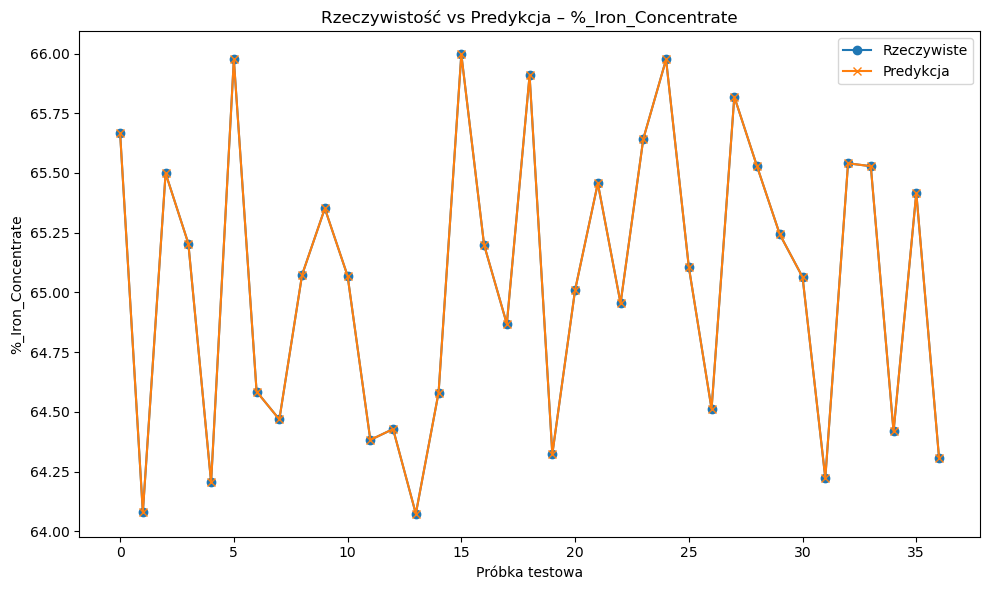

                                                                 Feature  \
const                                                          Intercept   
%_Iron_Concentrate_Smooth                      %_Iron_Concentrate_Smooth   
%_Iron_Feed_Smooth                                    %_Iron_Feed_Smooth   
Ore_Pulp_pH_Smooth                                    Ore_Pulp_pH_Smooth   
Ore_Pulp_Density_Smooth                          Ore_Pulp_Density_Smooth   
Amina_Flow_Smooth                                      Amina_Flow_Smooth   
Starch_Flow_Smooth                                    Starch_Flow_Smooth   
Flotation_Column_01_Air_Flow_Smooth  Flotation_Column_01_Air_Flow_Smooth   
Flotation_Column_01_Level_Smooth        Flotation_Column_01_Level_Smooth   
Flotation_Column_02_Air_Flow_Smooth  Flotation_Column_02_Air_Flow_Smooth   
Flotation_Column_02_Level_Smooth        Flotation_Column_02_Level_Smooth   
Flotation_Column_03_Air_Flow_Smooth  Flotation_Column_03_Air_Flow_Smooth   
Flotation_Co

In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import savgol_filter
import statsmodels.api as sm

# 1. Wczytanie danych
pandas_df = pd.read_csv('quality-prediction.csv')

# 2. Konwersja danych numerycznych
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# 3. Konwersja daty
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')
pandas_df = pandas_df.dropna(subset=['date'])

# 4. Indeks czasu
pandas_df = pandas_df.set_index('date').sort_index()

# 5. Uśrednienie dzienne
daily_df = pandas_df.resample('1D').mean()

# 6. Wygładzanie
base_cols = [
    '%_Iron_Concentrate', '%_Iron_Feed',
    'Ore_Pulp_pH', 'Ore_Pulp_Density',
    'Amina_Flow', 'Starch_Flow'
]

# Dodaj wszystkie 7 flotacji: Air_Flow + Level
for i in range(1, 8):
    base_cols.append(f'Flotation_Column_0{i}_Air_Flow')
    base_cols.append(f'Flotation_Column_0{i}_Level')

# Wygładzanie
for col in base_cols:
    daily_df[col + '_Smooth'] = savgol_filter(
        daily_df[col].fillna(method='ffill').fillna(method='bfill'),
        window_length=7, polyorder=3
    )

# 7. Przygotowanie cech
feature_cols = [col + '_Smooth' for col in base_cols]

X = daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill').values
y = daily_df['%_Iron_Concentrate_Smooth'].fillna(0).values

# 8. Podział na trening/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 9. Model regresji liniowej
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# 10. Ocena
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.4f}')
print(f'R^2 Score: {r2:.4f}')

# 11. Współczynniki
coeff_df = pd.DataFrame({
    'Feature': feature_cols,
    'Coefficient': model.coef_
})
print(coeff_df)

# 12. Wykres porównawczy
plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Rzeczywiste', marker='o')
plt.plot(y_pred, label='Predykcja', marker='x')
plt.title('Rzeczywistość vs Predykcja – %_Iron_Concentrate')
plt.xlabel('Próbka testowa')
plt.ylabel('%_Iron_Concentrate')
plt.legend()
plt.tight_layout()
plt.show()

# 13. Test t-Studenta
X_sm = sm.add_constant(daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill'))
ols_model = sm.OLS(y, X_sm).fit()
summary_df = pd.DataFrame({
    'Feature': ['Intercept'] + feature_cols,
    'Coefficient': ols_model.params,
    'Std Error': ols_model.bse,
    't Stat': ols_model.tvalues,
    'p Value': ols_model.pvalues
})
print(summary_df)


Mean Squared Error: 0.0726
R^2 Score: 0.7895
                                Feature  Coefficient
0                    %_Iron_Feed_Smooth    -0.010061
1                    Ore_Pulp_pH_Smooth     0.491374
2               Ore_Pulp_Density_Smooth     0.554064
3                     Amina_Flow_Smooth    -0.005046
4                    Starch_Flow_Smooth     0.000083
5   Flotation_Column_01_Air_Flow_Smooth     0.009949
6   Flotation_Column_02_Air_Flow_Smooth    -0.004658
7   Flotation_Column_03_Air_Flow_Smooth     0.004158
8   Flotation_Column_04_Air_Flow_Smooth    -0.072614
9   Flotation_Column_05_Air_Flow_Smooth     0.047889
10  Flotation_Column_06_Air_Flow_Smooth    -0.009989
11  Flotation_Column_07_Air_Flow_Smooth     0.005324
12     Flotation_Column_01_Level_Smooth     0.001386
13     Flotation_Column_02_Level_Smooth     0.001398
14     Flotation_Column_03_Level_Smooth    -0.003208
15     Flotation_Column_04_Level_Smooth     0.008451
16     Flotation_Column_05_Level_Smooth    -0.003538
1

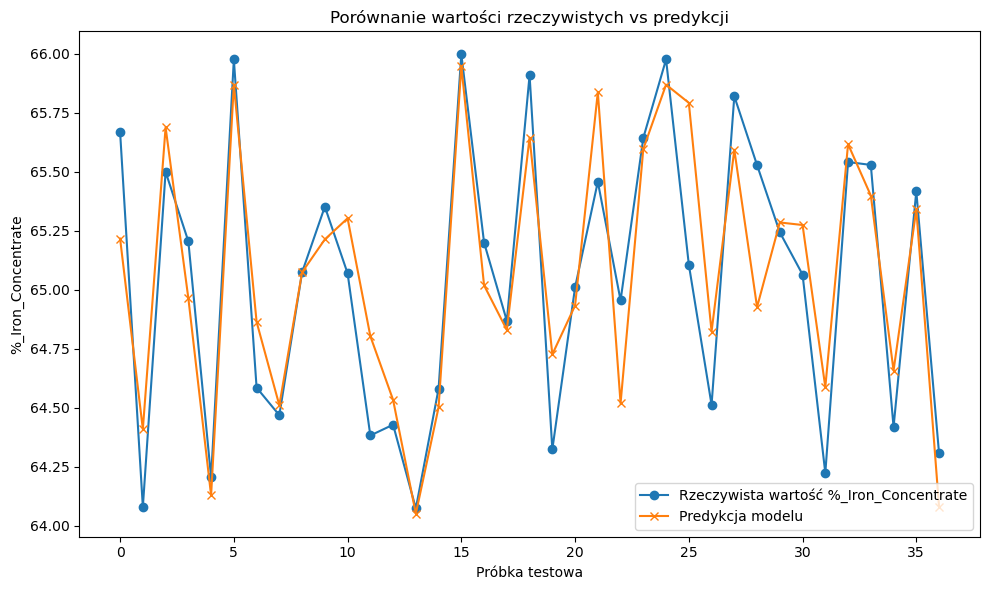

                                                                 Feature  \
const                                                          Intercept   
%_Iron_Feed_Smooth                                    %_Iron_Feed_Smooth   
Ore_Pulp_pH_Smooth                                    Ore_Pulp_pH_Smooth   
Ore_Pulp_Density_Smooth                          Ore_Pulp_Density_Smooth   
Amina_Flow_Smooth                                      Amina_Flow_Smooth   
Starch_Flow_Smooth                                    Starch_Flow_Smooth   
Flotation_Column_01_Air_Flow_Smooth  Flotation_Column_01_Air_Flow_Smooth   
Flotation_Column_02_Air_Flow_Smooth  Flotation_Column_02_Air_Flow_Smooth   
Flotation_Column_03_Air_Flow_Smooth  Flotation_Column_03_Air_Flow_Smooth   
Flotation_Column_04_Air_Flow_Smooth  Flotation_Column_04_Air_Flow_Smooth   
Flotation_Column_05_Air_Flow_Smooth  Flotation_Column_05_Air_Flow_Smooth   
Flotation_Column_06_Air_Flow_Smooth  Flotation_Column_06_Air_Flow_Smooth   
Flotation_Co

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

# 1. Wczytanie danych
pandas_df = pd.read_csv('quality-prediction.csv')

# 2. Zamiana przecinków na kropki i konwersja na float
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# 3. Konwersja daty
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')
pandas_df = pandas_df.dropna(subset=['date'])

# 4. Ustawienie indeksu i sortowanie
pandas_df = pandas_df.set_index('date').sort_index()

# 5. Grupowanie dzienne
daily_df = pandas_df.resample('1D').mean()

# 6. Lista kolumn do wygładzenia (dodajemy kolumny air flow i level 01-07)
columns_to_smooth = [
    '%_Iron_Concentrate',
    '%_Iron_Feed',
    'Ore_Pulp_pH',
    'Ore_Pulp_Density',
    'Amina_Flow',
    'Starch_Flow'
] + [f'Flotation_Column_0{i}_Air_Flow' for i in range(1, 8)] \
  + [f'Flotation_Column_0{i}_Level' for i in range(1, 8)]

for col in columns_to_smooth:
    if col in daily_df.columns:
        daily_df[col + '_Smooth'] = savgol_filter(
            daily_df[col].fillna(method='ffill').fillna(method='bfill'),
            window_length=7, polyorder=3
        )

# 7. Przygotowanie danych do modelu
feature_cols = [
    '%_Iron_Feed_Smooth',
    'Ore_Pulp_pH_Smooth',
    'Ore_Pulp_Density_Smooth',
    'Amina_Flow_Smooth',
    'Starch_Flow_Smooth'
] + [f'Flotation_Column_0{i}_Air_Flow_Smooth' for i in range(1, 8)] \
  + [f'Flotation_Column_0{i}_Level_Smooth' for i in range(1, 8)]

X = daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill').values
y = daily_df['%_Iron_Concentrate_Smooth'].fillna(0).values  # wartość docelowa

# 8. Podział danych
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 9. Model regresji
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# 10. Ocena
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.4f}')
print(f'R^2 Score: {r2:.4f}')

# 11. Współczynniki
coeff_df = pd.DataFrame({
    'Feature': feature_cols,
    'Coefficient': model.coef_
})
print(coeff_df)

# 12. Wykres predykcji vs rzeczywistość
plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Rzeczywista wartość %_Iron_Concentrate', marker='o')
plt.plot(y_pred, label='Predykcja modelu', marker='x')
plt.title('Porównanie wartości rzeczywistych vs predykcji')
plt.xlabel('Próbka testowa')
plt.ylabel('%_Iron_Concentrate')
plt.legend()
plt.tight_layout()
plt.show()

# 13. Statystyki t-Studenta
X_sm = sm.add_constant(daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill'))
ols_model = sm.OLS(y, X_sm).fit()
summary_df = pd.DataFrame({
    'Feature': ['Intercept'] + feature_cols,
    'Coefficient': ols_model.params,
    'Std Error': ols_model.bse,
    't Stat': ols_model.tvalues,
    'p Value': ols_model.pvalues
})
print(summary_df)


Mean Squared Error: 0.2424
R^2 Score: 0.2970
                   Feature  Coefficient
0       %_Iron_Feed_Smooth     0.013665
1       Ore_Pulp_pH_Smooth     0.400149
2  Ore_Pulp_Density_Smooth     3.504616
3        Amina_Flow_Smooth    -0.008435
4       Starch_Flow_Smooth     0.000268


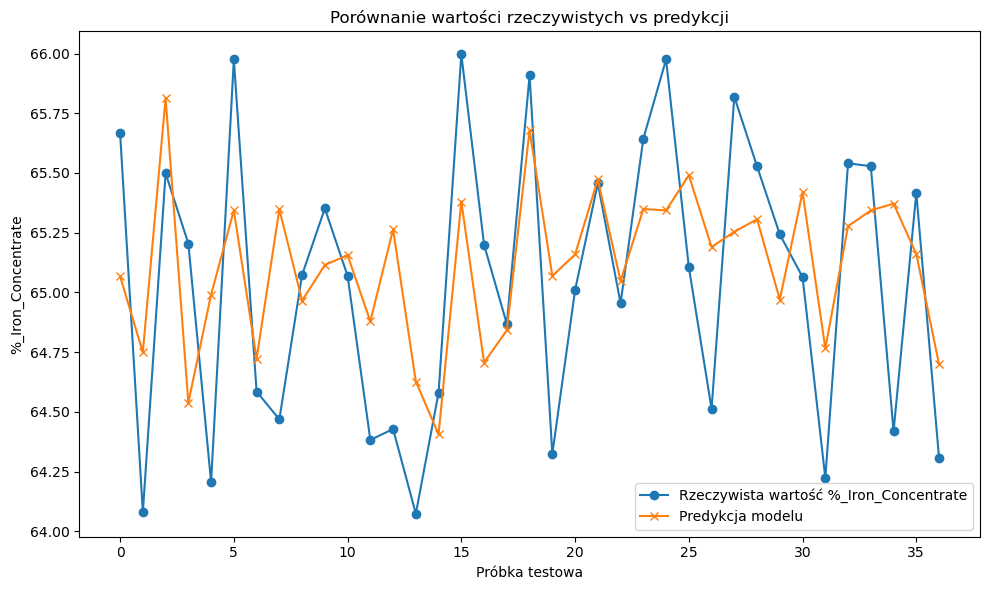

                                         Feature  Coefficient  Std Error  \
const                                  Intercept    58.988687   3.035290   
%_Iron_Feed_Smooth            %_Iron_Feed_Smooth     0.009465   0.009210   
Ore_Pulp_pH_Smooth            Ore_Pulp_pH_Smooth     0.374751   0.141433   
Ore_Pulp_Density_Smooth  Ore_Pulp_Density_Smooth     3.361855   1.562924   
Amina_Flow_Smooth              Amina_Flow_Smooth    -0.009103   0.001179   
Starch_Flow_Smooth            Starch_Flow_Smooth     0.000248   0.000068   

                            t Stat       p Value  
const                    19.434285  7.178278e-46  
%_Iron_Feed_Smooth        1.027690  3.054902e-01  
Ore_Pulp_pH_Smooth        2.649667  8.782347e-03  
Ore_Pulp_Density_Smooth   2.151003  3.282436e-02  
Amina_Flow_Smooth        -7.721902  7.978942e-13  
Starch_Flow_Smooth        3.639393  3.579322e-04  


In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

# 1. Wczytanie danych
pandas_df = pd.read_csv('quality-prediction.csv')

# 2. Zamiana przecinków na kropki i konwersja na float
for col in pandas_df.columns:
    if col != 'date':
        pandas_df[col] = pandas_df[col].astype(str).str.replace(',', '.').astype(float)

# 3. Konwersja daty
pandas_df['date'] = pd.to_datetime(pandas_df['date'].str.strip("'"), format='%Y-%m-%d %H:%M:%S', errors='coerce')
pandas_df = pandas_df.dropna(subset=['date'])

# 4. Ustawienie indeksu i sortowanie
pandas_df = pandas_df.set_index('date').sort_index()

# 5. Grupowanie dzienne
daily_df = pandas_df.resample('1D').mean()

# 6. Lista kolumn do wygładzenia (tylko te bez kolumn Air_Flow i Level)
columns_to_smooth = [
    '%_Iron_Concentrate',
    '%_Iron_Feed',
    'Ore_Pulp_pH',
    'Ore_Pulp_Density',
    'Amina_Flow',
    'Starch_Flow'
    # Usuwamy wszystkie flotation air flow i level
]

for col in columns_to_smooth:
    if col in daily_df.columns:
        daily_df[col + '_Smooth'] = savgol_filter(
            daily_df[col].fillna(method='ffill').fillna(method='bfill'),
            window_length=7, polyorder=3
        )

# 7. Przygotowanie danych do modelu - tylko wybrane cechy bez flotation columns
feature_cols = [
    '%_Iron_Feed_Smooth',
    'Ore_Pulp_pH_Smooth',
    'Ore_Pulp_Density_Smooth',
    'Amina_Flow_Smooth',
    'Starch_Flow_Smooth'
]

X = daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill').values
y = daily_df['%_Iron_Concentrate_Smooth'].fillna(0).values  # wartość docelowa

# 8. Podział danych
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 9. Model regresji
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# 10. Ocena
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.4f}')
print(f'R^2 Score: {r2:.4f}')

# 11. Współczynniki
coeff_df = pd.DataFrame({
    'Feature': feature_cols,
    'Coefficient': model.coef_
})
print(coeff_df)

# 12. Wykres predykcji vs rzeczywistość
plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Rzeczywista wartość %_Iron_Concentrate', marker='o')
plt.plot(y_pred, label='Predykcja modelu', marker='x')
plt.title('Porównanie wartości rzeczywistych vs predykcji')
plt.xlabel('Próbka testowa')
plt.ylabel('%_Iron_Concentrate')
plt.legend()
plt.tight_layout()
plt.show()

# 13. Statystyki t-Studenta
X_sm = sm.add_constant(daily_df[feature_cols].fillna(method='ffill').fillna(method='bfill'))
ols_model = sm.OLS(y, X_sm).fit()
summary_df = pd.DataFrame({
    'Feature': ['Intercept'] + feature_cols,
    'Coefficient': ols_model.params,
    'Std Error': ols_model.bse,
    't Stat': ols_model.tvalues,
    'p Value': ols_model.pvalues
})
print(summary_df)
